# NOTEBOOK OUTLINE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# PREREQUISITE INSTALLS

In [ ]:
# Some of these might need to be uncommented to work depending if you are running on Kaggle or Google Colab
!pip install catboost              # For Catboost classifier
#!pip install umap                  # For UMAP in feature extraction
#!pip install --upgrade umap-learn  # For UMAP in feature extraction
!pip install dataprep               # For Dataprep interactive EDA

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 25.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 67.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 17.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 60.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 63.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.0/764.0 kB 42.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 73.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 66.0 MB/s eta 0:00:00
  Created wheel for sqlalchemy: filen

In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 409.6/409.6 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 230.6/230.6 kB 25.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.9 MB/s eta 0:00:00


In [ ]:
!pip install lightgbm

# IMPORT MAIN LIBRARIES

In [ ]:
%%bash
pip install codecarbon

mkdir code_carbon

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.0/179.0 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 4.8 MB/s eta 0:00:00


In [ ]:
import sklearn

In [ ]:
sklearn.__version__

'1.2.2'

In [ ]:
#import main libraries
from codecarbon import EmissionsTracker
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import catboost
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score
import optuna
from optuna.samplers import TPESampler
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.ensemble import ExtraTreesClassifier
import lightgbm as lgb
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from imblearn.metrics import specificity_score

from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.metrics import RocCurveDisplay, auc

from sklearn.model_selection import RepeatedKFold
from optuna import create_study
from optuna.integration import XGBoostPruningCallback, CatBoostPruningCallback, LightGBMPruningCallback

from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold, StratifiedKFold
import warnings
warnings.filterwarnings('ignore')

# LOAD DATA

In [ ]:
np.random.seed(42)

In [ ]:
# LOCAL SYSTEM VERSION

df_initial = pd.read_csv('/content/drive/MyDrive/Glioma grading project/TCGA_GBM_LGG_Mutations_all.csv')

# Show the first 5 rows of the dataframe
print("\nFirst 5 rows of the dataframe: ")
df_initial.head()


First 5 rows of the dataframe: 


,Grade,Project,Case_ID,Gender,Age_at_diagnosis,Primary_Diagnosis,Race,IDH1,TP53,ATRX,...,FUBP1,RB1,NOTCH1,BCOR,CSMD3,SMARCA4,GRIN2A,IDH2,FAT4,PDGFRA
0,LGG,TCGA-LGG,TCGA-DU-8164,Male,51 years 108 days,"Oligodendroglioma, NOS",white,MUTATED,NOT_MUTATED,NOT_MUTATED,...,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
1,LGG,TCGA-LGG,TCGA-QH-A6CY,Male,38 years 261 days,Mixed glioma,white,MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
2,LGG,TCGA-LGG,TCGA-HW-A5KM,Male,35 years 62 days,"Astrocytoma, NOS",white,MUTATED,MUTATED,MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
3,LGG,TCGA-LGG,TCGA-E1-A7YE,Female,32 years 283 days,"Astrocytoma, anaplastic",white,MUTATED,MUTATED,MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED
4,LGG,TCGA-LGG,TCGA-S9-A6WG,Male,31 years 187 days,"Astrocytoma, anaplastic",white,MUTATED,MUTATED,MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED


In [ ]:
filtered_df_ = df_initial[~df_initial['Age_at_diagnosis'].str.contains(r'^\d+ years \d+ days$', na=False)]

# Extract the values of 'Age_at_diagnosis' that do not match the pattern
values_not_in_pattern = filtered_df_['Age_at_diagnosis'].values

# Output the values that do not match the pattern
print(values_not_in_pattern)

['87 years' '--' '--' '67 years' '--' '--' '--']


In [ ]:
df_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 862 entries, 0 to 861
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Grade              862 non-null    object
 1   Project            862 non-null    object
 2   Case_ID            862 non-null    object
 3   Gender             862 non-null    object
 4   Age_at_diagnosis   862 non-null    object
 5   Primary_Diagnosis  862 non-null    object
 6   Race               862 non-null    object
 7   IDH1               862 non-null    object
 8   TP53               862 non-null    object
 9   ATRX               862 non-null    object
 10  PTEN               862 non-null    object
 11  EGFR               862 non-null    object
 12  CIC                862 non-null    object
 13  MUC16              862 non-null    object
 14  PIK3CA             862 non-null    object
 15  NF1                862 non-null    object
 16  PIK3R1             862 non-null    object
 1

In [ ]:
df_initial.describe()

,Grade,Project,Case_ID,Gender,Age_at_diagnosis,Primary_Diagnosis,Race,IDH1,TP53,ATRX,...,FUBP1,RB1,NOTCH1,BCOR,CSMD3,SMARCA4,GRIN2A,IDH2,FAT4,PDGFRA
count,862,862,862,862,862,862,862,862,862,862,...,862,862,862,862,862,862,862,862,862,862
unique,2,2,862,3,838,7,6,2,2,2,...,2,2,2,2,2,2,2,2,2,2
top,LGG,TCGA-LGG,TCGA-DU-8164,Male,--,Glioblastoma,white,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
freq,499,499,1,499,5,360,766,448,508,642,...,815,821,824,833,834,834,835,839,839,840


In [ ]:
def convert_to_float(value):
    # Check if the value contains the string ' years ' and ' days'
    if ' years ' in value and ' days' in value:
        years, days = value.split(' years ')
        days = days.replace(' days', '')
        years = int(years)
        days = int(days)
        fraction_of_year = days / 365
        result = years + fraction_of_year
        return result
    elif 'years' in value:
      values, years = value.split(' ')
      return int(values)
    else:
        # If the format is not as expected, return None or any default value as needed
        return '--'

In [ ]:
df_initial['Age_at_diagnosis'] = df_initial['Age_at_diagnosis'].apply(convert_to_float)

In [ ]:
df_initial

,Grade,Project,Case_ID,Gender,Age_at_diagnosis,Primary_Diagnosis,Race,IDH1,TP53,ATRX,...,FUBP1,RB1,NOTCH1,BCOR,CSMD3,SMARCA4,GRIN2A,IDH2,FAT4,PDGFRA
0,LGG,TCGA-LGG,TCGA-DU-8164,Male,51.29589,"Oligodendroglioma, NOS",white,MUTATED,NOT_MUTATED,NOT_MUTATED,...,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
1,LGG,TCGA-LGG,TCGA-QH-A6CY,Male,38.715068,Mixed glioma,white,MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
2,LGG,TCGA-LGG,TCGA-HW-A5KM,Male,35.169863,"Astrocytoma, NOS",white,MUTATED,MUTATED,MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
3,LGG,TCGA-LGG,TCGA-E1-A7YE,Female,32.775342,"Astrocytoma, anaplastic",white,MUTATED,MUTATED,MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED
4,LGG,TCGA-LGG,TCGA-S9-A6WG,Male,31.512329,"Astrocytoma, anaplastic",white,MUTATED,MUTATED,MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
857,GBM,TCGA-GBM,TCGA-19-5959,Female,77.890411,Glioblastoma,white,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
858,GBM,TCGA-GBM,TCGA-16-0846,Male,85.178082,Glioblastoma,white,NOT_MUTATED,MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
859,GBM,TCGA-GBM,TCGA-28-1746,Female,77.487671,Glioblastoma,white,NOT_MUTATED,MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
860,GBM,TCGA-GBM,TCGA-32-2491,Male,63.331507,Glioblastoma,white,NOT_MUTATED,MUTATED,NOT_MUTATED,...,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED


In [ ]:
df_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 862 entries, 0 to 861
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Grade              862 non-null    object
 1   Project            862 non-null    object
 2   Case_ID            862 non-null    object
 3   Gender             862 non-null    object
 4   Age_at_diagnosis   862 non-null    object
 5   Primary_Diagnosis  862 non-null    object
 6   Race               862 non-null    object
 7   IDH1               862 non-null    object
 8   TP53               862 non-null    object
 9   ATRX               862 non-null    object
 10  PTEN               862 non-null    object
 11  EGFR               862 non-null    object
 12  CIC                862 non-null    object
 13  MUC16              862 non-null    object
 14  PIK3CA             862 non-null    object
 15  NF1                862 non-null    object
 16  PIK3R1             862 non-null    object
 1

In [ ]:
# List of columns to remove
columns_to_remove = ['Project', 'Case_ID', 'Primary_Diagnosis']

# Remove the specified columns
df_initial = df_initial.drop(columns=columns_to_remove)

In [ ]:
df_initial

,Grade,Gender,Age_at_diagnosis,Race,IDH1,TP53,ATRX,PTEN,EGFR,CIC,...,FUBP1,RB1,NOTCH1,BCOR,CSMD3,SMARCA4,GRIN2A,IDH2,FAT4,PDGFRA
0,LGG,Male,51.29589,white,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
1,LGG,Male,38.715068,white,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
2,LGG,Male,35.169863,white,MUTATED,MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
3,LGG,Female,32.775342,white,MUTATED,MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED
4,LGG,Male,31.512329,white,MUTATED,MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
857,GBM,Female,77.890411,white,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
858,GBM,Male,85.178082,white,NOT_MUTATED,MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
859,GBM,Female,77.487671,white,NOT_MUTATED,MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
860,GBM,Male,63.331507,white,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED


In [ ]:
# filtered_df_ = df_initial[~df_initial['Age_at_diagnosis'].str.contains(r'^\d+ years \d+ days$', na=False)]

# # Extract the values of 'Age_at_diagnosis' that do not match the pattern
# values_not_in_pattern = filtered_df_['Age_at_diagnosis'].values

# # Output the values that do not match the pattern
# print(values_not_in_pattern)

In [ ]:
df_initial['Race'].value_counts()

white                               766
black or african american            59
not reported                         18
asian                                14
--                                    4
american indian or alaska native      1
Name: Race, dtype: int64

In [ ]:
w = df_initial[df_initial['Race']=='--']

In [ ]:
w

,Grade,Gender,Age_at_diagnosis,Race,IDH1,TP53,ATRX,PTEN,EGFR,CIC,...,FUBP1,RB1,NOTCH1,BCOR,CSMD3,SMARCA4,GRIN2A,IDH2,FAT4,PDGFRA
41,LGG,--,--,--,MUTATED,MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
671,GBM,--,--,--,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
706,GBM,--,--,--,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
794,GBM,--,--,--,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED


In [ ]:
# Define the conditions for filtering
race_condition = (df_initial['Race'] != 'not reported') & (df_initial['Race'] != '--')
gender_condition = (df_initial['Gender'] != '--')
Age_condition = (df_initial['Age_at_diagnosis'] != '--')

# Combine the conditions to filter the DataFrame
filtered_df = df_initial[race_condition & gender_condition & Age_condition]
# Reset the index to get a new DataFrame with a sorted index
filtered_df = filtered_df.reset_index(drop=True)

In [ ]:
filtered_df

,Grade,Gender,Age_at_diagnosis,Race,IDH1,TP53,ATRX,PTEN,EGFR,CIC,...,FUBP1,RB1,NOTCH1,BCOR,CSMD3,SMARCA4,GRIN2A,IDH2,FAT4,PDGFRA
0,LGG,Male,51.29589,white,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
1,LGG,Male,38.715068,white,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
2,LGG,Male,35.169863,white,MUTATED,MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
3,LGG,Female,32.775342,white,MUTATED,MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED
4,LGG,Male,31.512329,white,MUTATED,MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
834,GBM,Female,77.890411,white,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
835,GBM,Male,85.178082,white,NOT_MUTATED,MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
836,GBM,Female,77.487671,white,NOT_MUTATED,MUTATED,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED
837,GBM,Male,63.331507,white,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,...,NOT_MUTATED,MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED,NOT_MUTATED


In [ ]:
# Convert the 'Column_Name' to float
filtered_df['Age_at_diagnosis'] = filtered_df['Age_at_diagnosis'].astype(float)

In [ ]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 839 entries, 0 to 838
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Grade             839 non-null    object 
 1   Gender            839 non-null    object 
 2   Age_at_diagnosis  839 non-null    float64
 3   Race              839 non-null    object 
 4   IDH1              839 non-null    object 
 5   TP53              839 non-null    object 
 6   ATRX              839 non-null    object 
 7   PTEN              839 non-null    object 
 8   EGFR              839 non-null    object 
 9   CIC               839 non-null    object 
 10  MUC16             839 non-null    object 
 11  PIK3CA            839 non-null    object 
 12  NF1               839 non-null    object 
 13  PIK3R1            839 non-null    object 
 14  FUBP1             839 non-null    object 
 15  RB1               839 non-null    object 
 16  NOTCH1            839 non-null    object 
 1

In [ ]:
filtered_df['Grade'].value_counts()

LGG    487
GBM    352
Name: Grade, dtype: int64

In [ ]:
filtered_df.describe()

,Age_at_diagnosis
count,839.000000
mean,50.935383
std,15.702388
min,14.421918
25%,38.050685
50%,51.550685
75%,62.800000
max,89.287671


The plot will not show in a notebook environment, please try 'show_browser' if you want to open it in browser



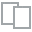
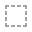
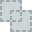
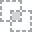
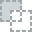
...
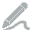
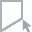
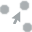
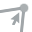
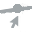

In [ ]:
from dataprep.eda import create_report, plot, plot_correlation, plot_missing , plot_diff

# Create Dataprep EDA report
report = create_report(filtered_df)

# Show the report
report.show()

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
input_cols = list(filtered_df.columns)[1:]
target_col = 'Grade'

In [ ]:
input_cols

['Gender',
 'Age_at_diagnosis',
 'Race',
 'IDH1',
 'TP53',
 'ATRX',
 'PTEN',
 'EGFR',
 'CIC',
 'MUC16',
 'PIK3CA',
 'NF1',
 'PIK3R1',
 'FUBP1',
 'RB1',
 'NOTCH1',
 'BCOR',
 'CSMD3',
 'SMARCA4',
 'GRIN2A',
 'IDH2',
 'FAT4',
 'PDGFRA']

In [ ]:
train_inputs = filtered_df[input_cols].copy()
train_targets = filtered_df[target_col].copy()

In [ ]:
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [ ]:
numeric_cols

['Age_at_diagnosis']

In [ ]:
categorical_cols

['Gender',
 'Race',
 'IDH1',
 'TP53',
 'ATRX',
 'PTEN',
 'EGFR',
 'CIC',
 'MUC16',
 'PIK3CA',
 'NF1',
 'PIK3R1',
 'FUBP1',
 'RB1',
 'NOTCH1',
 'BCOR',
 'CSMD3',
 'SMARCA4',
 'GRIN2A',
 'IDH2',
 'FAT4',
 'PDGFRA']

In [ ]:
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

In [ ]:
encoder.fit(filtered_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False, sparse_output=False)

In [ ]:
encoder.categories_

[array(['Female', 'Male'], dtype=object),
 array(['american indian or alaska native', 'asian',
        'black or african american', 'white'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=object),
 array(['MUTATED', 'NOT_MUTATED'], dtype=ob

In [ ]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))

In [ ]:
print(encoded_cols)

['Gender_Female', 'Gender_Male', 'Race_american indian or alaska native', 'Race_asian', 'Race_black or african american', 'Race_white', 'IDH1_MUTATED', 'IDH1_NOT_MUTATED', 'TP53_MUTATED', 'TP53_NOT_MUTATED', 'ATRX_MUTATED', 'ATRX_NOT_MUTATED', 'PTEN_MUTATED', 'PTEN_NOT_MUTATED', 'EGFR_MUTATED', 'EGFR_NOT_MUTATED', 'CIC_MUTATED', 'CIC_NOT_MUTATED', 'MUC16_MUTATED', 'MUC16_NOT_MUTATED', 'PIK3CA_MUTATED', 'PIK3CA_NOT_MUTATED', 'NF1_MUTATED', 'NF1_NOT_MUTATED', 'PIK3R1_MUTATED', 'PIK3R1_NOT_MUTATED', 'FUBP1_MUTATED', 'FUBP1_NOT_MUTATED', 'RB1_MUTATED', 'RB1_NOT_MUTATED', 'NOTCH1_MUTATED', 'NOTCH1_NOT_MUTATED', 'BCOR_MUTATED', 'BCOR_NOT_MUTATED', 'CSMD3_MUTATED', 'CSMD3_NOT_MUTATED', 'SMARCA4_MUTATED', 'SMARCA4_NOT_MUTATED', 'GRIN2A_MUTATED', 'GRIN2A_NOT_MUTATED', 'IDH2_MUTATED', 'IDH2_NOT_MUTATED', 'FAT4_MUTATED', 'FAT4_NOT_MUTATED', 'PDGFRA_MUTATED', 'PDGFRA_NOT_MUTATED']


In [ ]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])

In [ ]:
X = train_inputs[numeric_cols + encoded_cols]

In [ ]:
X

,Age_at_diagnosis,Gender_Female,Gender_Male,Race_american indian or alaska native,Race_asian,Race_black or african american,Race_white,IDH1_MUTATED,IDH1_NOT_MUTATED,TP53_MUTATED,...,SMARCA4_MUTATED,SMARCA4_NOT_MUTATED,GRIN2A_MUTATED,GRIN2A_NOT_MUTATED,IDH2_MUTATED,IDH2_NOT_MUTATED,FAT4_MUTATED,FAT4_NOT_MUTATED,PDGFRA_MUTATED,PDGFRA_NOT_MUTATED
0,51.295890,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
1,38.715068,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
2,35.169863,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
3,32.775342,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0
4,31.512329,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
834,77.890411,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
835,85.178082,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
836,77.487671,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
837,63.331507,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0


In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 839 entries, 0 to 838
Data columns (total 47 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Age_at_diagnosis                       839 non-null    float64
 1   Gender_Female                          839 non-null    float64
 2   Gender_Male                            839 non-null    float64
 3   Race_american indian or alaska native  839 non-null    float64
 4   Race_asian                             839 non-null    float64
 5   Race_black or african american         839 non-null    float64
 6   Race_white                             839 non-null    float64
 7   IDH1_MUTATED                           839 non-null    float64
 8   IDH1_NOT_MUTATED                       839 non-null    float64
 9   TP53_MUTATED                           839 non-null    float64
 10  TP53_NOT_MUTATED                       839 non-null    float64
 11  ATRX_M

In [ ]:
le = LabelEncoder()
le.fit(train_targets)
le_name_map = dict(zip(le.classes_, le.transform(le.classes_)))
le_name_map

{'GBM': 0, 'LGG': 1}

In [ ]:
train_targets = pd.Series(train_targets)

In [ ]:
# Convert values in the "Sex" column from "m" to "1" and from "f" to "0"
train_targets.loc[train_targets == "GBM"] = "0"
train_targets.loc[train_targets == "LGG"] = "1"

In [ ]:
# Convert all values in the dataframe to numeric
train_targets = train_targets.apply(pd.to_numeric, errors='coerce')

In [ ]:
train_targets

0      1
1      1
2      1
3      1
4      1
      ..
834    0
835    0
836    0
837    0
838    0
Name: Grade, Length: 839, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split

# Split the dataframe into a training and testing set
X_train, X_test, y_train, y_test = train_test_split(X, train_targets, test_size=0.2, stratify = train_targets, shuffle=True, random_state=42)#, random_state=42. #

In [ ]:
# Show the classes balance in the training set
print('Training Set Class Balance: \n', y_train.value_counts())

Training Set Class Balance: 
 1    389
0    282
Name: Grade, dtype: int64


In [ ]:
# Show the classes balance in the test set
print('Test Set Class Balance: \n', y_test.value_counts())

Test Set Class Balance: 
 1    98
0    70
Name: Grade, dtype: int64


In [ ]:
X_train

,Age_at_diagnosis,Gender_Female,Gender_Male,Race_american indian or alaska native,Race_asian,Race_black or african american,Race_white,IDH1_MUTATED,IDH1_NOT_MUTATED,TP53_MUTATED,...,SMARCA4_MUTATED,SMARCA4_NOT_MUTATED,GRIN2A_MUTATED,GRIN2A_NOT_MUTATED,IDH2_MUTATED,IDH2_NOT_MUTATED,FAT4_MUTATED,FAT4_NOT_MUTATED,PDGFRA_MUTATED,PDGFRA_NOT_MUTATED
625,45.619178,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
426,35.191781,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0
244,30.652055,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
400,32.432877,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0
275,22.835616,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,62.520548,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
267,48.852055,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
550,74.983562,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
702,54.213699,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0


# Catboost

In [ ]:
import sklearn

In [ ]:
sklearn.metrics.get_scorer_names()

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'matthews_corrcoef',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_absolute_percentage_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_negative_likelihood_ratio',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'positive_likelihood_ratio',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'rand_score',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',

In [ ]:
# Catboost
model_Cat = catboost.CatBoostClassifier(verbose=False, random_state=2023)
scores = cross_validate(model_Cat, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
#model_Cat.fit(X_train, y_train)

AUC
0.9175593303138841 0.010550312499796644
Accuracy
0.865326489877388 0.012143515078821018
Precision
0.9197281996784922 0.0335347275116132
Recall
0.8440774247843468 0.039081134274380105
F1 score
0.878900604039923 0.012770728314802141


In [ ]:
catboost_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy : %.2f%%" % (catboost_accuracy * 100.0))

Accuracy : 86.77%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(model_Cat, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.8950100603621729 0.04788772973806389


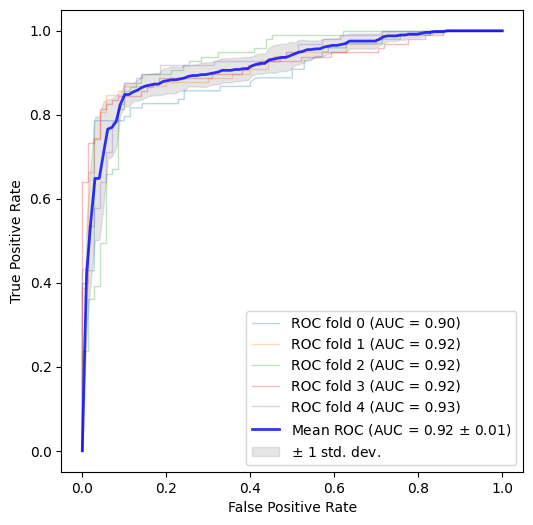

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    model_Cat.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        model_Cat,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
model_Cat.fit(X_train, y_train)
y_pred = model_Cat.predict(X_test)

In [ ]:
# # Catboost
# model_Cat = catboost.CatBoostClassifier(verbose=False)
# scores = cross_validate(model_Cat, X_test,y_test , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
# print("AUC")
# print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
# print("Accuracy")
# print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
# print("Precision")
# print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
# print("Recall")
# print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
# print("F1 score")
# print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
# #model_Cat.fit(X_train, y_train)

AUC
0.9050751879699247 0.04371616343337165
Accuracy
0.8634581105169341 0.04367165047685806
Precision
0.8950292397660817 0.03119980322614485
Recall
0.8678947368421053 0.05087598304671397
F1 score
0.8808677098150781 0.03872937631669257


Confusion matrix, without normalization
[[63  7]
 [11 87]]
Normalized confusion matrix
[[0.9       0.1      ]
 [0.1122449 0.8877551]]


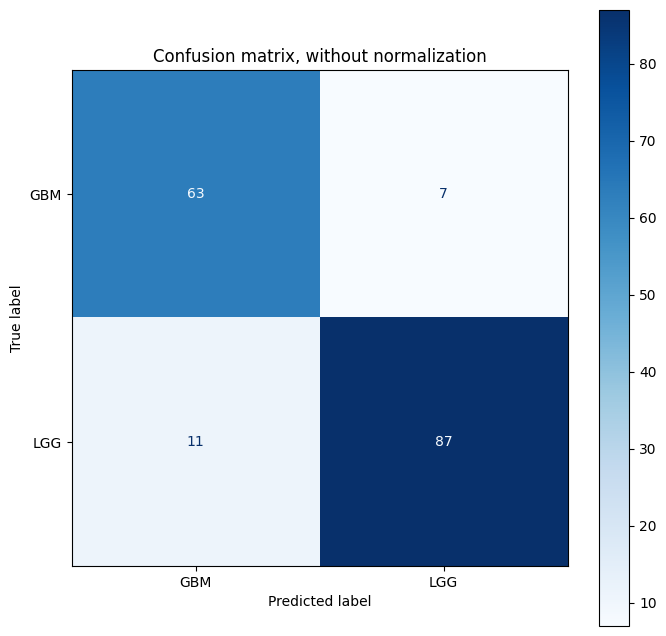

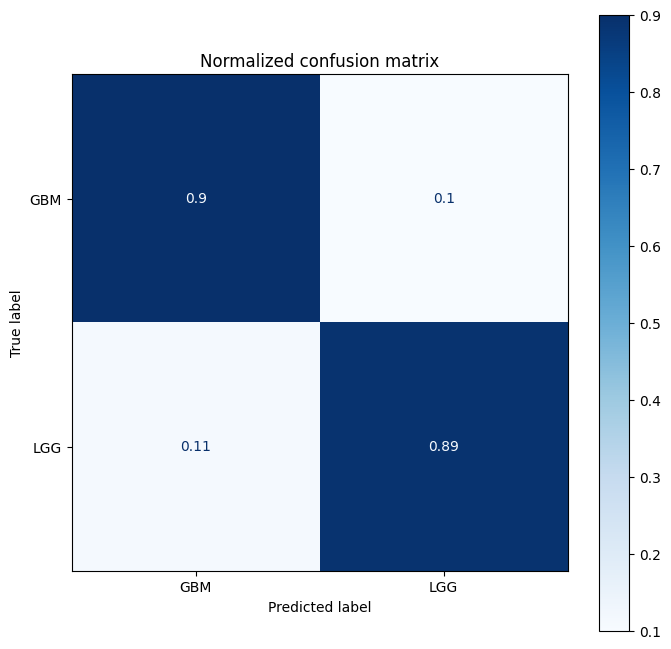

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        model_Cat,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

CATBOOST WITH OPTUNA

In [ ]:
experiment_name = "CatBoost"

tracker = EmissionsTracker(
    output_dir="./code_carbon/",
    output_file=f"{experiment_name}_emissions.csv",
    log_level="error",  # comment out this line to see regular output
)
tracker.start()



In [ ]:
def objective(trial):
    model_optuna = catboost.CatBoostClassifier(
        iterations=trial.suggest_int("iterations", 100, 1000),
        learning_rate=trial.suggest_float("learning_rate", 1e-3, 1e-1, log=True),
        depth=trial.suggest_int("depth", 4, 10),
        l2_leaf_reg=trial.suggest_float("l2_leaf_reg", 1e-8, 100.0, log=True),
        bootstrap_type=trial.suggest_categorical("bootstrap_type", ["Bayesian"]),
        random_strength=trial.suggest_float("random_strength", 1e-8, 10.0, log=True),
        bagging_temperature=trial.suggest_float("bagging_temperature", 0.0, 10.0),
        od_type=trial.suggest_categorical("od_type", ["IncToDec", "Iter"]),
        od_wait=trial.suggest_int("od_wait", 10, 50),
        verbose=False
    )


    return np.mean(cross_val_score(model_optuna, X, train_targets, cv=5, scoring='accuracy', verbose=0)) * 100

In [ ]:
#optuna.logging.set_verbosity(optuna.logging.WARNING)

sampler = TPESampler(seed=1)
study = optuna.create_study(study_name="catboost", direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=500)

[I 2023-10-15 15:53:32,713] A new study created in memory with name: catboost
[I 2023-10-15 15:53:36,590] Trial 0 finished with value: 85.93527231251782 and parameters: {'iterations': 475, 'learning_rate': 0.027583475549166746, 'depth': 4, 'l2_leaf_reg': 1.0551779964424746e-05, 'bootstrap_type': 'Bayesian', 'random_strength': 2.0931628460945333e-07, 'bagging_temperature': 0.923385947687978, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 0 with value: 85.93527231251782.
[I 2023-10-15 15:53:57,105] Trial 1 finished with value: 86.05503279155974 and parameters: {'iterations': 585, 'learning_rate': 0.006892694481137703, 'depth': 8, 'l2_leaf_reg': 1.10795595820296e-06, 'bootstrap_type': 'Bayesian', 'random_strength': 0.7999391045172093, 'bagging_temperature': 0.27387593197926163, 'od_type': 'IncToDec', 'od_wait': 32}. Best is trial 1 with value: 86.05503279155974.
[I 2023-10-15 15:54:14,925] Trial 2 finished with value: 86.65169660678643 and parameters: {'iterations': 226, 'learning_rate'

In [ ]:
# Evaluate emissions
catboost_emissions = tracker.stop()
print(f"Emissions from this training run: {catboost_emissions:.5f} kg CO2eq")

Emissions from this training run: 0.03139 kg CO2eq


In [ ]:
print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

Number of finished trials:  500
Best trial:
  Value:  88.08311947533504
  Params: 
    iterations: 956
    learning_rate: 0.004339270122571784
    depth: 4
    l2_leaf_reg: 0.009605617747003777
    bootstrap_type: Bayesian
    random_strength: 3.1412085379847636
    bagging_temperature: 1.1477032701806564
    od_type: IncToDec
    od_wait: 13


In [ ]:
params = trial.params
params

{'iterations': 956,
 'learning_rate': 0.004339270122571784,
 'depth': 4,
 'l2_leaf_reg': 0.009605617747003777,
 'bootstrap_type': 'Bayesian',
 'random_strength': 3.1412085379847636,
 'bagging_temperature': 1.1477032701806564,
 'od_type': 'IncToDec',
 'od_wait': 13}

In [ ]:
params = {'iterations': 956,
 'learning_rate': 0.004339270122571784,
 'depth': 4,
 'l2_leaf_reg': 0.009605617747003777,
 'bootstrap_type': 'Bayesian',
 'random_strength': 3.1412085379847636,
 'bagging_temperature': 1.1477032701806564,
 'od_type': 'IncToDec',
 'od_wait': 13}

model_Cat_optuna = catboost.CatBoostClassifier(**params, verbose=False, random_state=2023)
scores = cross_validate(model_Cat_optuna, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
#model_Cat.fit(X_train, y_train)

AUC
0.9140638402262937 0.01032036034009959
Accuracy
0.8784431137724551 0.007848086735070326
Precision
0.9396159392341022 0.021829236583938698
Recall
0.8460972017673049 0.02993640577457546
F1 score
0.8896924838445169 0.008843077120463306


In [ ]:
catboost_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy after tuning: %.2f%%" % (catboost_accuracy * 100.0))

Accuracy after tuning: 87.84%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(model_Cat_optuna, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.9232997987927565 0.030672960340580098


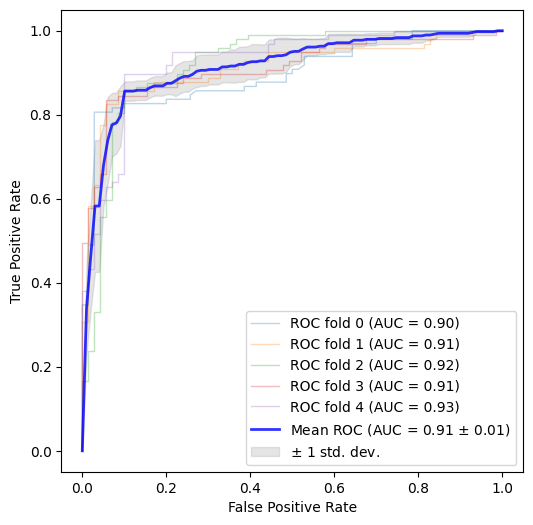

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    model_Cat_optuna.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        model_Cat_optuna,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
# # Catboost
# model_Cat_optuna = catboost.CatBoostClassifier(**params, verbose=False)
# scores = cross_validate(model_Cat_optuna, X_test,y_test , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
# print("AUC")
# print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
# print("Accuracy")
# print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
# print("Precision")
# print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
# print("Recall")
# print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
# print("F1 score")
# print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
# #model_Cat.fit(X_train, y_train)

AUC
0.9013157894736843 0.04086623524510357
Accuracy
0.8754010695187165 0.0571311675901278
Precision
0.9065079365079365 0.050115512826372846
Recall
0.8778947368421053 0.06025338923353126
F1 score
0.8913544738576832 0.050512210573738316


In [ ]:
model_Cat_optuna = catboost.CatBoostClassifier(**params, verbose=False, random_state=2023)
model_Cat_optuna.fit(X_train, y_train)
y_pred = model_Cat_optuna.predict(X_test)

Confusion matrix, without normalization
[[64  6]
 [12 86]]
Normalized confusion matrix
[[0.91428571 0.08571429]
 [0.12244898 0.87755102]]


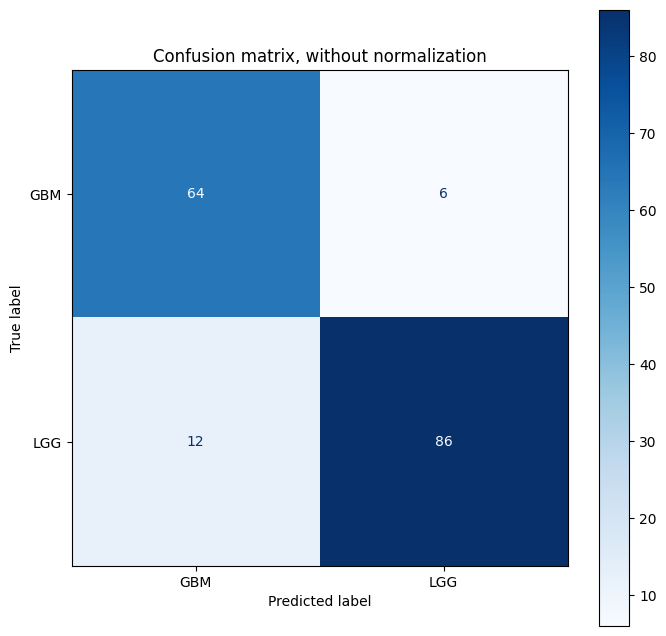

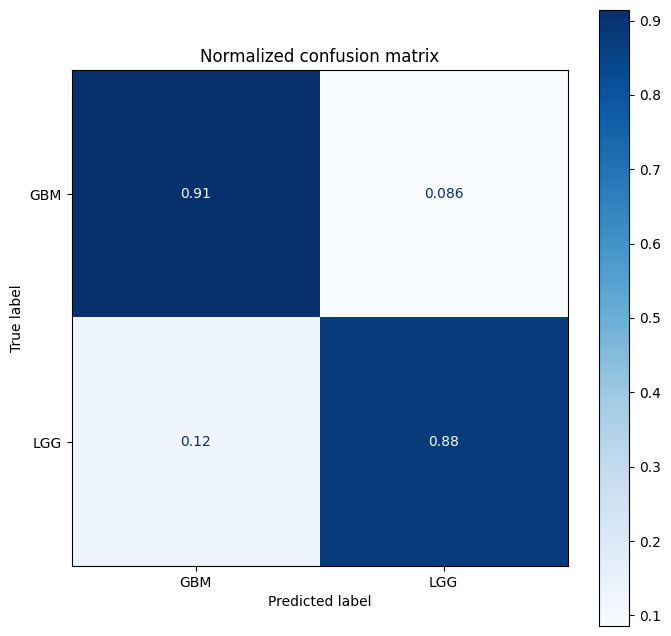

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        model_Cat_optuna,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

In [ ]:
model_Cat_optuna.feature_importances_

array([10.51220536,  0.51656796,  0.73764303,  0.        ,  0.2394271 ,
        0.53725127,  0.73844713, 15.909298  , 14.0440655 ,  3.09403386,
        1.72895684,  1.36056199,  1.49660281,  1.79929822,  1.51807624,
        0.73087626,  0.72348627,  3.98882712,  6.72902918,  1.54265271,
        2.04929256,  0.50669772,  0.39003545,  0.79618351,  1.14512478,
        0.7749783 ,  0.86305448,  2.29266782,  2.11855164,  0.81202919,
        0.84698939,  2.7795726 ,  2.5903059 ,  0.55361763,  0.49947304,
        0.79890158,  0.60375766,  1.46478495,  0.80509448,  0.78970641,
        0.96941332,  2.01505994,  3.45587665,  0.53225711,  0.65892949,
        0.4808691 ,  0.45946844])

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_Cat_optuna.feature_importances_,X_train.columns)), columns=['Value','Feature'])
feature_imp

,Value,Feature
0,0.000000,Race_american indian or alaska native
1,0.239427,Race_asian
2,0.390035,PIK3CA_NOT_MUTATED
3,0.459468,PDGFRA_NOT_MUTATED
4,0.480869,PDGFRA_MUTATED
5,0.499473,BCOR_NOT_MUTATED
6,0.506698,PIK3CA_MUTATED
7,0.516568,Gender_Female
8,0.532257,FAT4_MUTATED
9,0.537251,Race_black or african american


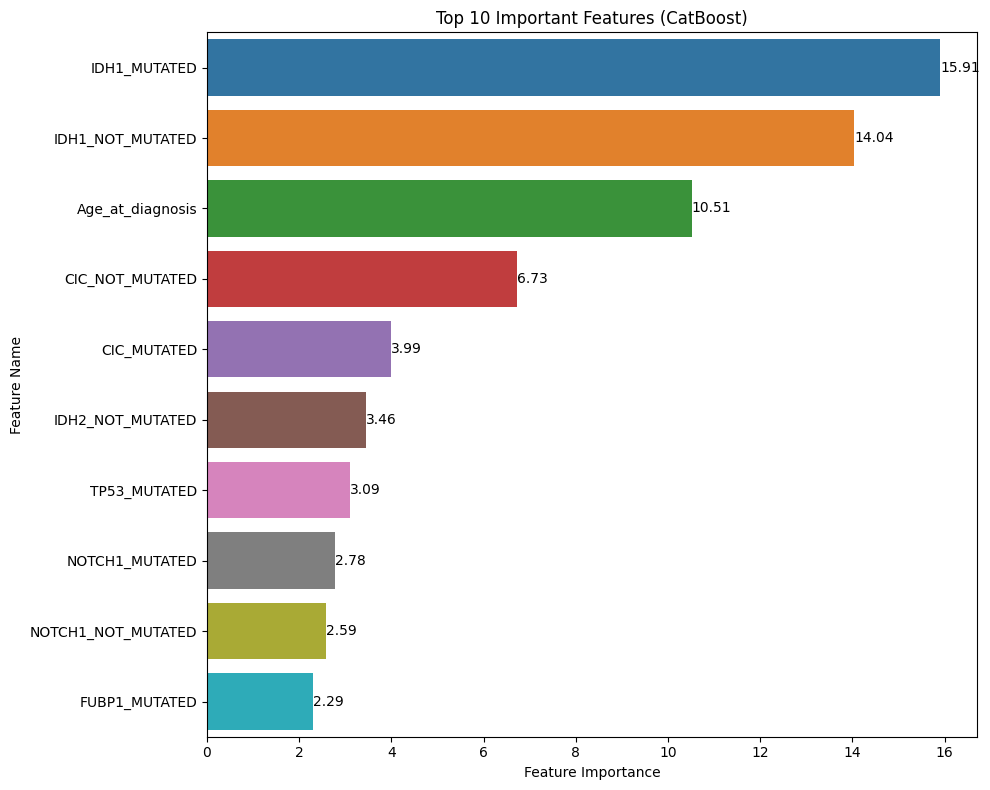

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_Cat_optuna.feature_importances_, X_train.columns)), columns=['Value', 'Feature'])

# Select the top 10 features with the largest importance values
top_10_features = feature_imp.nlargest(10, 'Value')

plt.figure(figsize=(10, 8))
ax = sns.barplot(x="Value", y="Feature", data=top_10_features)
plt.title('Top 10 Important Features (CatBoost)')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')

# Annotate each bar with its value
for index, value in enumerate(top_10_features['Value']):
    ax.text(value, index, f'{value:.2f}', ha='left', va='center')

plt.tight_layout()
plt.show()


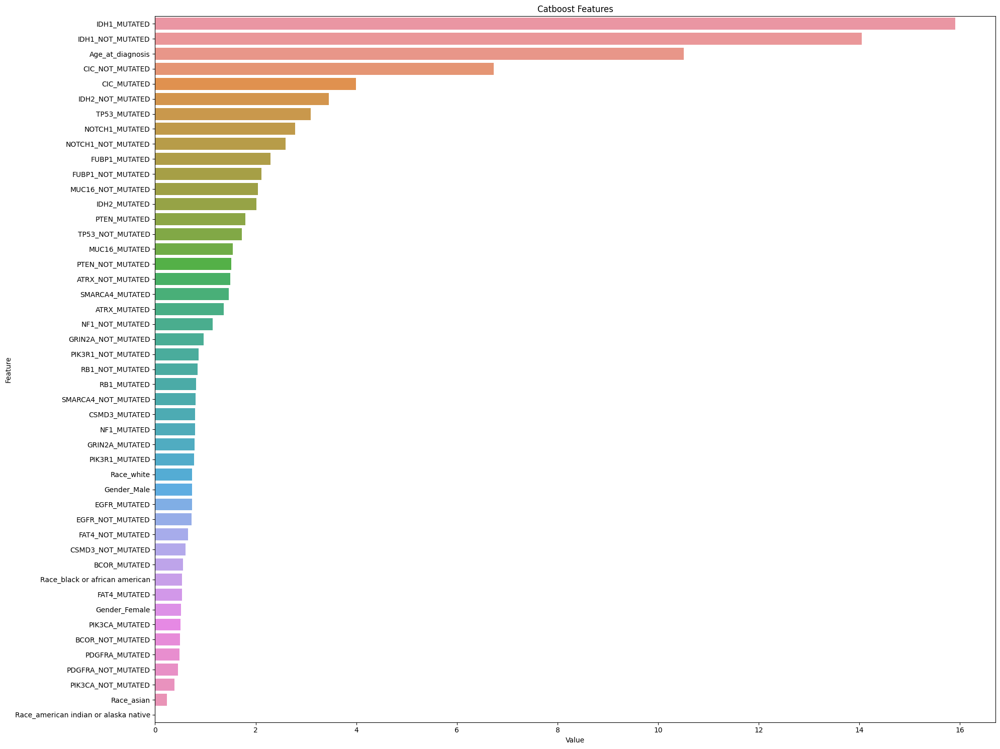

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_Cat_optuna.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 15))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('Catboost Features')
plt.tight_layout()
# plt.savefig('lightgbm_fimp.png')

# XGBClassifier

In [ ]:
# Catboost
model_xgb = XGBClassifier(use_label_encoder=False,
                      eval_metric='mlogloss')
scores = cross_validate(model_xgb, X,train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1'],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
#model_Cat.fit(X_train, y_train)

AUC
0.896870649523059 0.0162527771161969
Accuracy
0.8200313658397491 0.005588495012032133
Precision
0.8550728854477686 0.02723098691839241
Recall
0.8338102251209761 0.043671332561989865
F1 score
0.8428317334394683 0.010250067803238644


In [ ]:
xgboost_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy: %.2f%%" % (xgboost_accuracy * 100.0))

Accuracy: 82.00%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(model_xgb, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.8011267605633803 0.05110641803529238


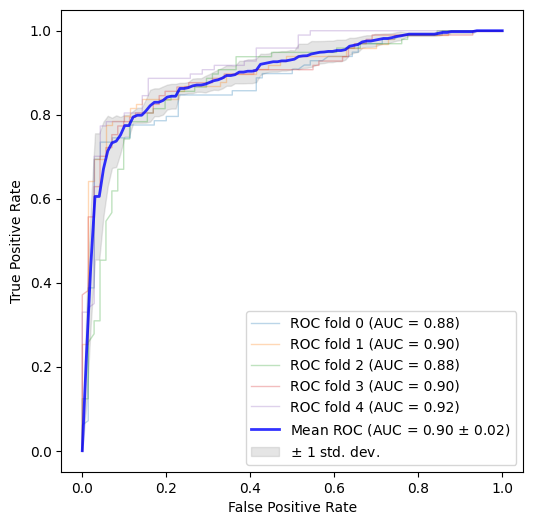

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    model_xgb.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        model_xgb,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
model_xgb = XGBClassifier(use_label_encoder=False,
                      eval_metric='mlogloss')
model_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [ ]:
y_pred = model_xgb.predict(X_test)

Confusion matrix, without normalization
[[61  9]
 [10 88]]
Normalized confusion matrix
[[0.87142857 0.12857143]
 [0.10204082 0.89795918]]


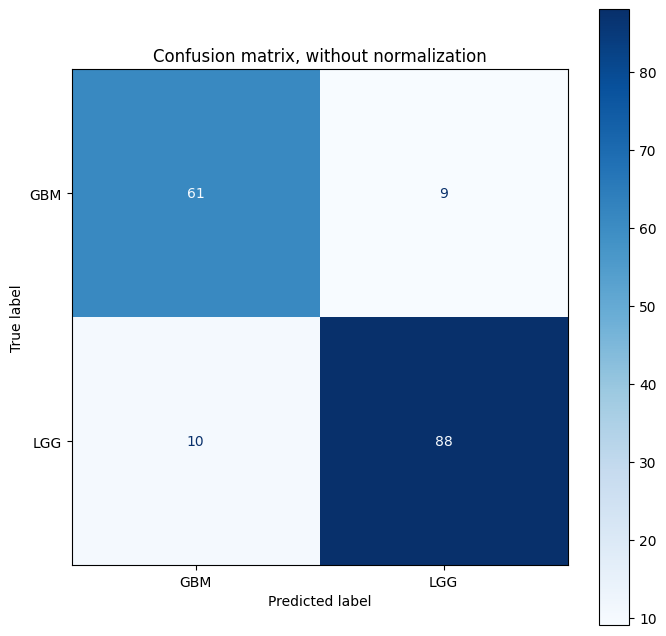

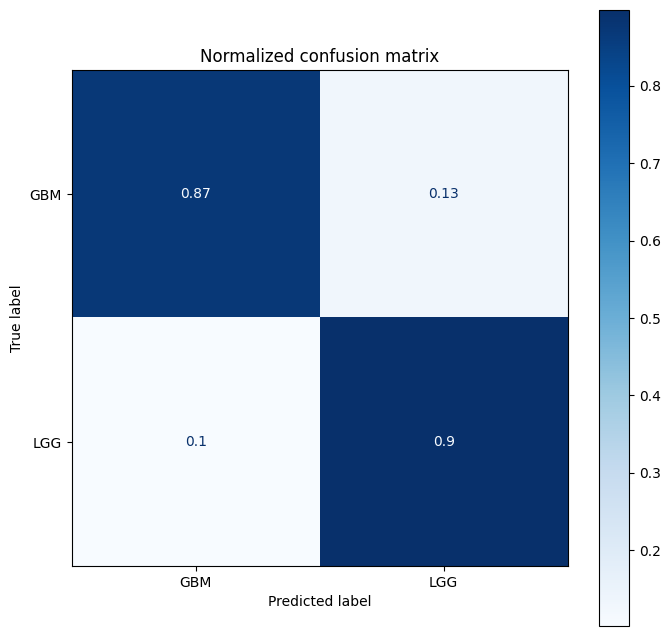

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        model_xgb,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

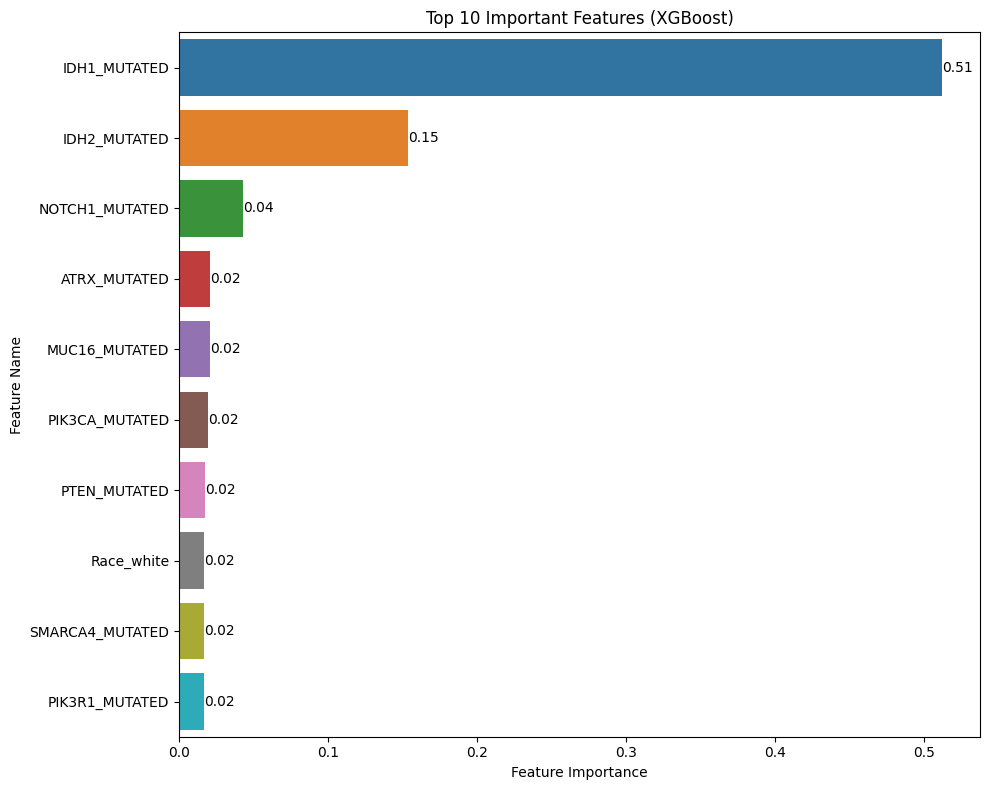

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_xgb.feature_importances_, X_train.columns)), columns=['Value', 'Feature'])

# Select the top 10 features with the largest importance values
top_10_features = feature_imp.nlargest(10, 'Value')

plt.figure(figsize=(10, 8))
ax = sns.barplot(x="Value", y="Feature", data=top_10_features)
plt.title('Top 10 Important Features (XGBoost)')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')

# Annotate each bar with its value
for index, value in enumerate(top_10_features['Value']):
    ax.text(value, index, f'{value:.2f}', ha='left', va='center')

plt.tight_layout()
plt.show()


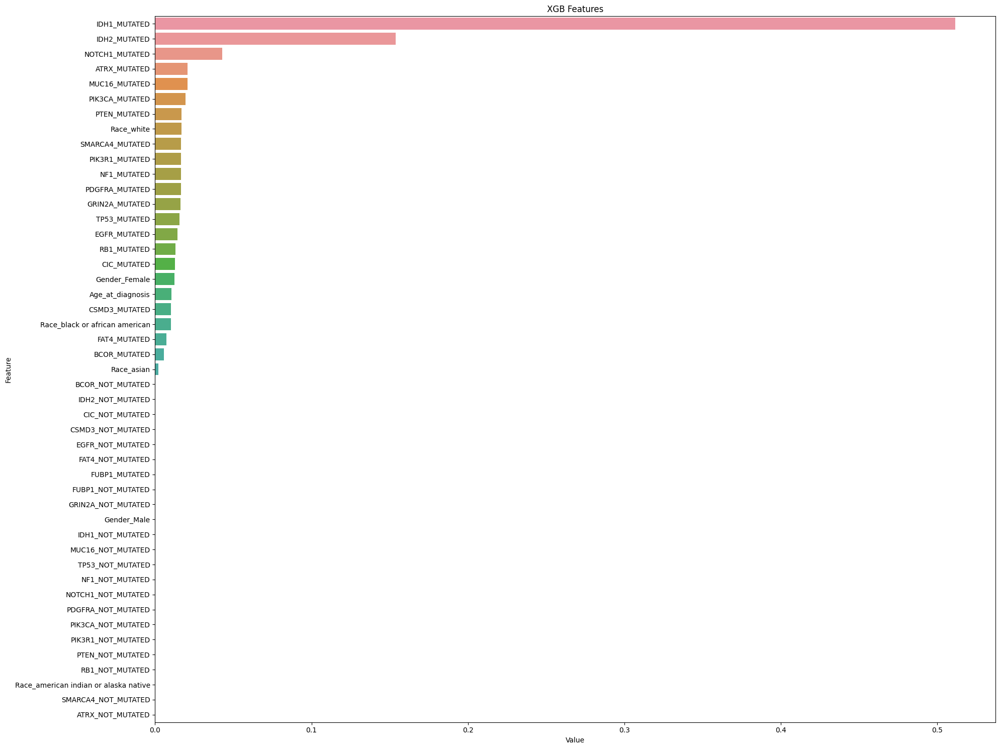

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_xgb.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 15))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('XGB Features')
plt.tight_layout()
# plt.savefig('lightgbm_fimp.png')

# XGBClassifier with Optuna

In [ ]:
import xgboost
experiment_name = "XGBoost"

tracker = EmissionsTracker(
    output_dir="./code_carbon/",
    output_file=f"{experiment_name}_emissions.csv",
    log_level="error",  # comment out this line to see regular output
)
tracker.start()



In [ ]:
def objective(trial):
    """Define the objective function"""

    params = {
        'max_depth': trial.suggest_int('max_depth', 1, 9),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1.0),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_loguniform('gamma', 1e-8, 1.0),
        'subsample': trial.suggest_loguniform('subsample', 0.01, 1.0),
        'colsample_bytree': trial.suggest_loguniform('colsample_bytree', 0.01, 1.0),
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-8, 1.0),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-8, 1.0),
        'eval_metric': 'mlogloss',
        'use_label_encoder': False,
        'seed': trial.suggest_int('seed', 1, 2023),
    }

    optuna_model = XGBClassifier(**params)


    return np.mean(cross_val_score(optuna_model, X, train_targets, cv=5, scoring='accuracy', verbose=0)) * 100#test_accuracy#, cv_accuracy

In [ ]:
study = optuna.create_study(study_name="xgboost", direction='maximize')
study.optimize(objective, n_trials=1000)

[I 2023-11-26 21:54:14,894] A new study created in memory with name: xgboost
[I 2023-11-26 21:54:44,376] Trial 0 finished with value: 84.26646706586827 and parameters: {'max_depth': 8, 'learning_rate': 0.2972094564838061, 'n_estimators': 797, 'min_child_weight': 4, 'gamma': 0.5545846361304522, 'subsample': 0.37206635970718915, 'colsample_bytree': 0.06787234666066831, 'reg_alpha': 0.0013873019993042009, 'reg_lambda': 2.296215767826243e-06, 'seed': 1872}. Best is trial 0 with value: 84.26646706586827.
[I 2023-11-26 21:54:48,862] Trial 1 finished with value: 58.045337895637296 and parameters: {'max_depth': 2, 'learning_rate': 0.15298866276163742, 'n_estimators': 444, 'min_child_weight': 4, 'gamma': 5.773366791549234e-08, 'subsample': 0.039097318388803176, 'colsample_bytree': 0.01346348463259853, 'reg_alpha': 2.880721584372104e-05, 'reg_lambda': 7.842646113831188e-06, 'seed': 1087}. Best is trial 0 with value: 84.26646706586827.
[I 2023-11-26 21:54:52,347] Trial 2 finished with value: 82.3

In [ ]:
# Evaluate emissions
xgboost_emissions = tracker.stop()
print(f"Emissions from this training run: {xgboost_emissions:.5f} kg CO2eq")

Emissions from this training run: 0.01236 kg CO2eq


In [ ]:
# #without cv
# print('Number of finished trials: {}'.format(len(study.trials)))
# print('Best trial:')
# trial = study.best_trial

# print('  Value: {}'.format(trial.value))
# print('  Params: ')

# for key, value in trial.params.items():
#     print('    {}: {}'.format(key, value))

Number of finished trials: 1000
Best trial:
  Value: 88.08169375534645
  Params: 
    max_depth: 1
    learning_rate: 0.08741825897248737
    n_estimators: 639
    min_child_weight: 1
    gamma: 4.8569235806061847e-05
    subsample: 0.7308082396818283
    colsample_bytree: 0.029489204550828648
    reg_alpha: 7.968242146657422e-06
    reg_lambda: 1.8006530783269831e-06
    seed: 1166


In [ ]:
#without cv
print('Number of finished trials: {}'.format(len(study.trials)))
print('Best trial:')
trial = study.best_trial

print('  Value: {}'.format(trial.value))
print('  Params: ')

for key, value in trial.params.items():
    print('    {}: {}'.format(key, value))

Number of finished trials: 1000
Best trial:
  Value: 88.08169375534645
  Params: 
    max_depth: 1
    learning_rate: 0.0872093937702263
    n_estimators: 988
    min_child_weight: 2
    gamma: 0.19742061908192798
    subsample: 0.9034895892313103
    colsample_bytree: 0.01446338279780691
    reg_alpha: 0.08929207215100589
    reg_lambda: 8.116062455767412e-07
    seed: 1808


In [ ]:
params = trial.params
params

{'max_depth': 1,
 'learning_rate': 0.0872093937702263,
 'n_estimators': 988,
 'min_child_weight': 2,
 'gamma': 0.19742061908192798,
 'subsample': 0.9034895892313103,
 'colsample_bytree': 0.01446338279780691,
 'reg_alpha': 0.08929207215100589,
 'reg_lambda': 8.116062455767412e-07,
 'seed': 1808}

In [ ]:
# params = {'max_depth': 1,
#  'learning_rate': 0.08741825897248737,
#  'n_estimators': 639,
#  'min_child_weight': 1,
#  'gamma': 4.8569235806061847e-05,
#  'subsample': 0.7308082396818283,
#  'colsample_bytree': 0.029489204550828648,
#  'reg_alpha': 7.968242146657422e-06,
#  'reg_lambda': 1.8006530783269831e-06,
#  'seed': 1166}

In [ ]:
params = {'max_depth': 1,
 'learning_rate': 0.0872093937702263,
 'n_estimators': 988,
 'min_child_weight': 2,
 'gamma': 0.19742061908192798,
 'subsample': 0.9034895892313103,
 'colsample_bytree': 0.01446338279780691,
 'reg_alpha': 0.08929207215100589,
 'reg_lambda': 8.116062455767412e-07,
 'seed': 1808}

In [ ]:
# Catboost
model_xgb_optuna = XGBClassifier(**params)
scores = cross_validate(model_xgb_optuna, X,train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))

AUC
0.9180639739975727 0.01253951355371373
Accuracy
0.8808169375534645 0.008326021633775844
Precision
0.9343848903367382 0.026199049653443378
Recall
0.8563854407742479 0.03311477721831138
F1 score
0.8927375458271503 0.009719563582561845


In [ ]:
xgboost_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy after tuning: %.2f%%" % (xgboost_accuracy * 100.0))

Accuracy after tuning: 88.08%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(model_xgb_optuna, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.9149295774647885 0.03673283874760516


In [ ]:
model_xgb_optuna = XGBClassifier(**params)
model_xgb_optuna.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.01446338279780691, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.19742061908192798,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.0872093937702263,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=988, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
sklearn.__version__

'1.2.2'

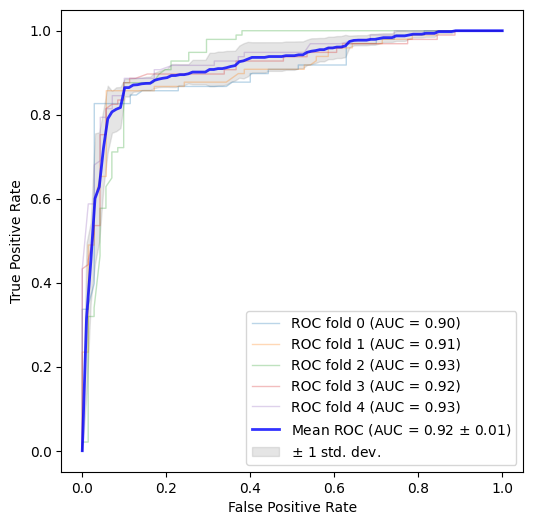

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)
# classifier = svm.SVC(kernel="linear", probability=True, random_state=random_state)
model_xgb_optuna = XGBClassifier(**params)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    model_xgb_optuna.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        model_xgb_optuna,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
y_pred = model_xgb_optuna.predict(X_test)

Confusion matrix, without normalization
[[65  5]
 [16 82]]
Normalized confusion matrix
[[0.92857143 0.07142857]
 [0.16326531 0.83673469]]


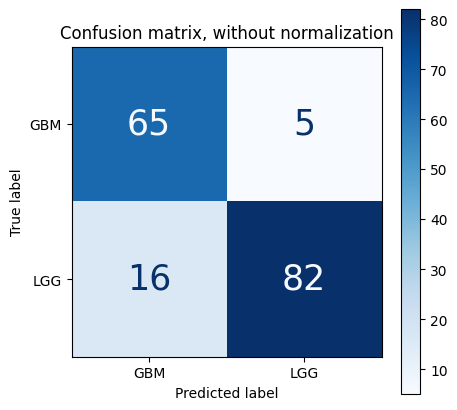

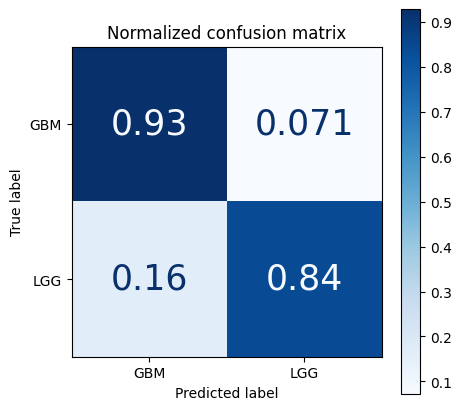

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(5, 5))

    disp = ConfusionMatrixDisplay.from_estimator(
        model_xgb_optuna,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    # Increase font size of numbers in the confusion matrix
    for text in disp.text_.ravel():
        text.set_fontsize(25)  # Adjust the font size as needed

    print(title)
    print(disp.confusion_matrix)

Confusion matrix, without normalization
[[62  8]
 [12 86]]
Normalized confusion matrix
[[0.88571429 0.11428571]
 [0.12244898 0.87755102]]


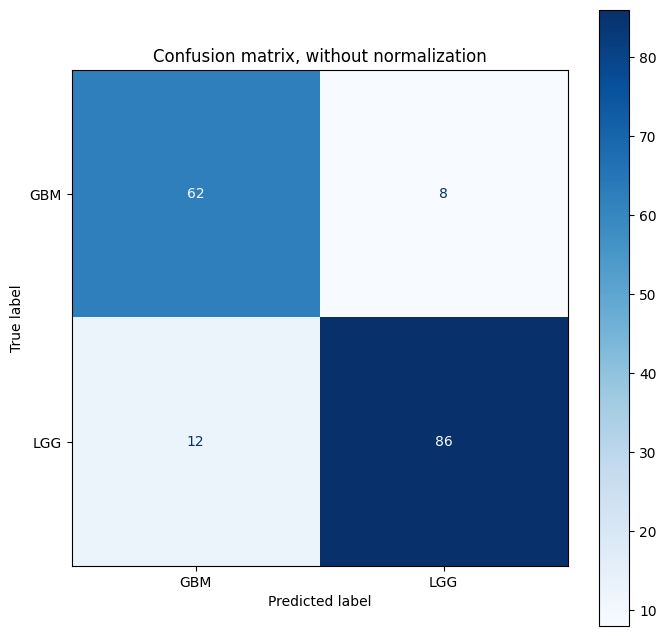

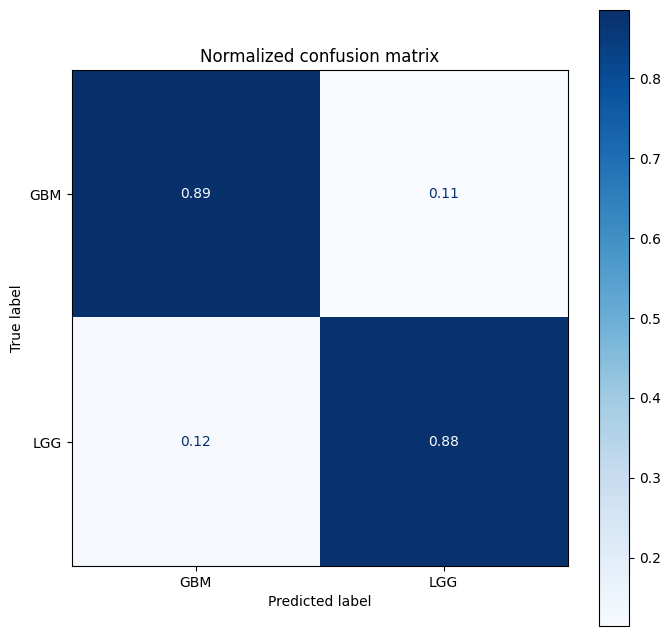

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        model_xgb_optuna,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)


    print(title)
    print(disp.confusion_matrix)

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_xgb_optuna.feature_importances_,X_train.columns)), columns=['Value','Feature'])
feature_imp

,Value,Feature
0,0.000000,BCOR_NOT_MUTATED
1,0.000000,Race_american indian or alaska native
2,0.000000,Race_asian
3,0.001120,BCOR_MUTATED
4,0.001837,PIK3CA_NOT_MUTATED
5,0.002204,FAT4_MUTATED
6,0.002395,PIK3CA_MUTATED
7,0.002405,FAT4_NOT_MUTATED
8,0.002474,Race_white
9,0.003524,CSMD3_MUTATED


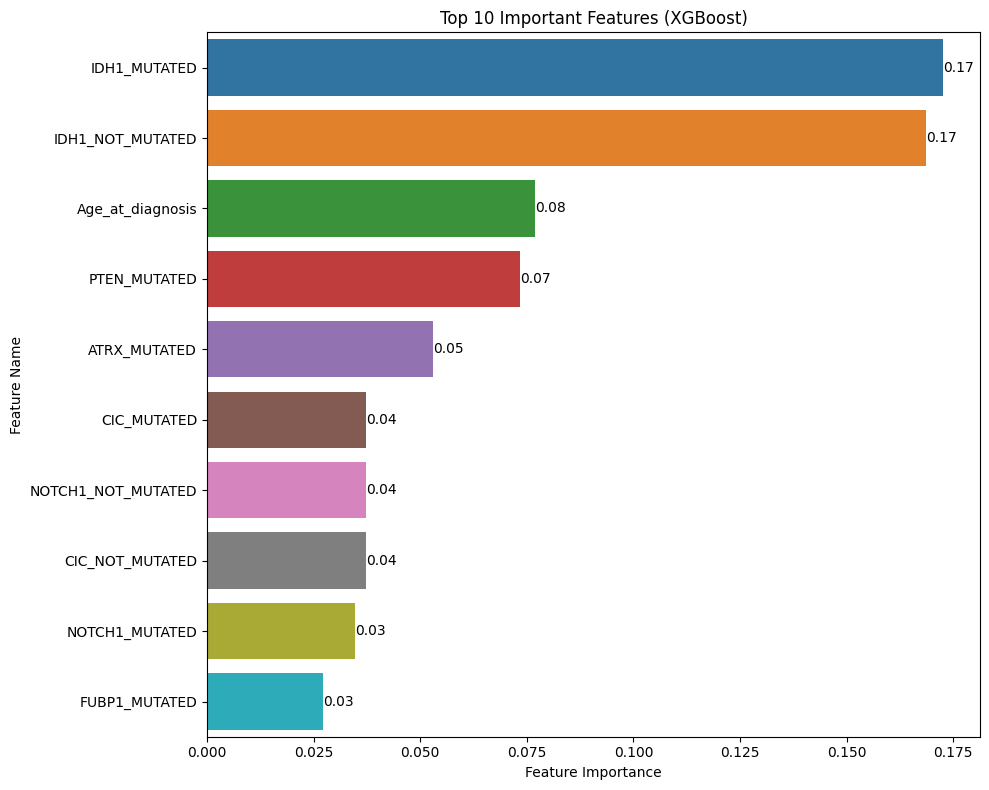

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_xgb_optuna.feature_importances_, X_train.columns)), columns=['Value', 'Feature'])

# Select the top 10 features with the largest importance values
top_10_features = feature_imp.nlargest(10, 'Value')

plt.figure(figsize=(10, 8))
ax = sns.barplot(x="Value", y="Feature", data=top_10_features)
plt.title('Top 10 Important Features (XGBoost)')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')

# Annotate each bar with its value
for index, value in enumerate(top_10_features['Value']):
    ax.text(value, index, f'{value:.2f}', ha='left', va='center')

plt.tight_layout()
plt.show()


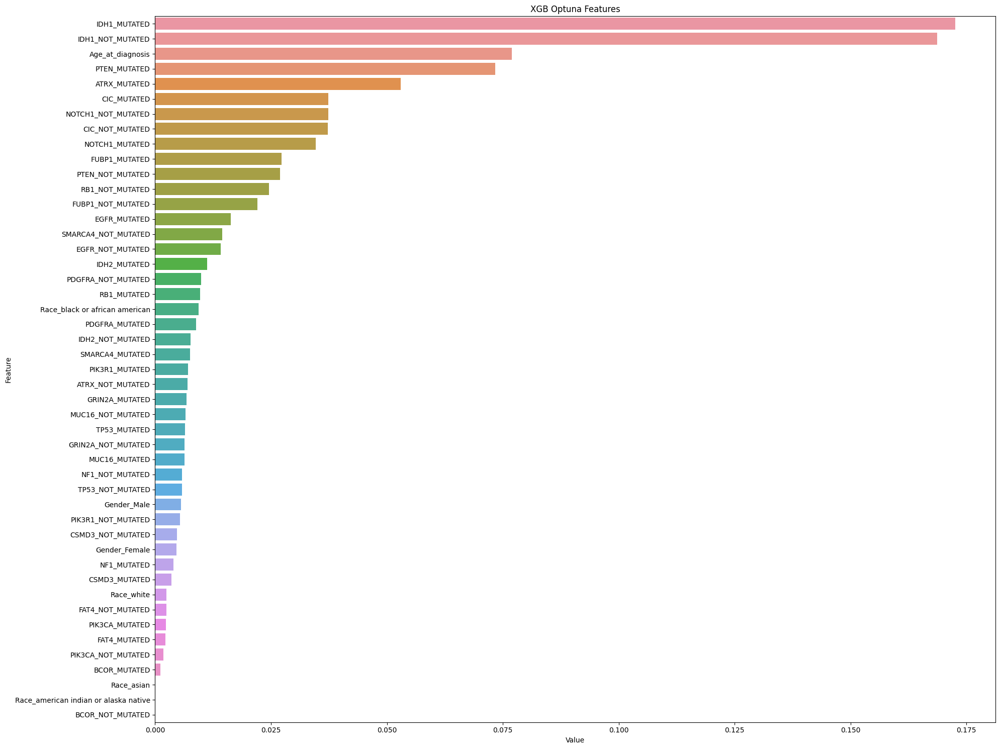

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_xgb_optuna.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 15))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('XGB Optuna Features')
plt.tight_layout()
# plt.savefig('lightgbm_fimp.png')

In [ ]:
import pickle

In [ ]:
file_name = '/content/drive/MyDrive/Hepatitis C Disease/my_model_hepatitisC_binary_ok_xgboost.sav'
pickle.dump(model_xgb_optuna, open(file_name, 'wb'))

# LGBM

In [ ]:
# !pip3 install lightgbm

In [ ]:
# !pip3 install lightgbm
# from sklearn.ensemble import ExtraTreesClassifier
# from sklearn.model_selection import cross_val_score
# import lightgbm as lgb

In [ ]:
import lightgbm as lgb

In [ ]:
# Catboost
lgb_model = lgb.LGBMClassifier()
scores = cross_validate(lgb_model, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
#model_Cat.fit(X_train, y_train)

AUC
0.8936516892222258 0.009456332117272044
Accuracy
0.8295836897633304 0.01555385364678631
Precision
0.8666356614671221 0.016773369982334335
Recall
0.8358720807910792 0.03605902890370448
F1 score
0.8503187112921362 0.016029848983163654


In [ ]:
lgb_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy : %.2f%%" % (lgb_accuracy * 100.0))

Accuracy : 82.96%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(lgb_model, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.8210462776659959 0.030266706186742768


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 389, number of negative: 282
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 300
[LightGBM] [Info] Number of data points in the train set: 671, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.579732 -> initscore=0.321672
[LightGBM] [Info] Start training from score 0.321672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

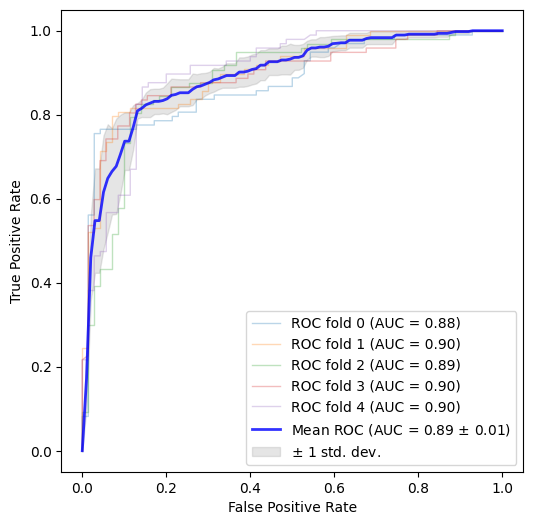

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    lgb_model.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        lgb_model,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
lgb_model = lgb.LGBMClassifier()
lgb_model.fit(X_train, y_train)
y_pred = lgb_model.predict(X_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 389, number of negative: 282
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 671, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.579732 -> initscore=0.321672
[LightGBM] [Info] Start training from score 0.321672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

Confusion matrix, without normalization
[[59 11]
 [ 9 89]]
Normalized confusion matrix
[[0.84285714 0.15714286]
 [0.09183673 0.90816327]]


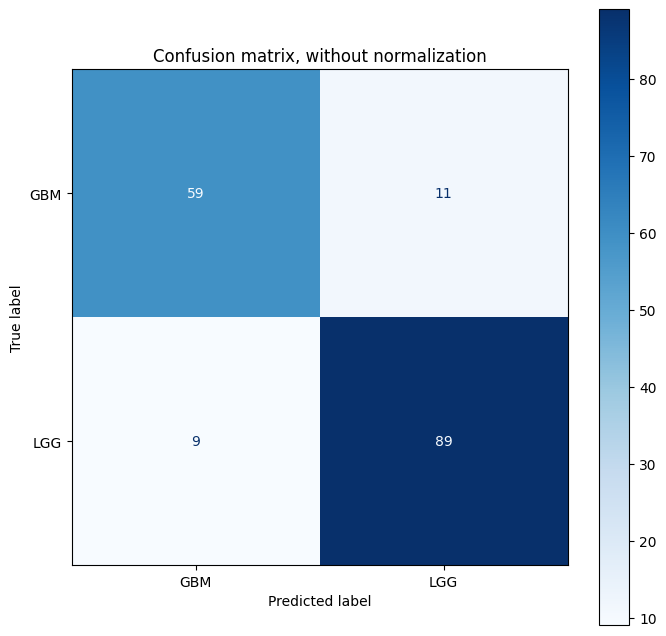

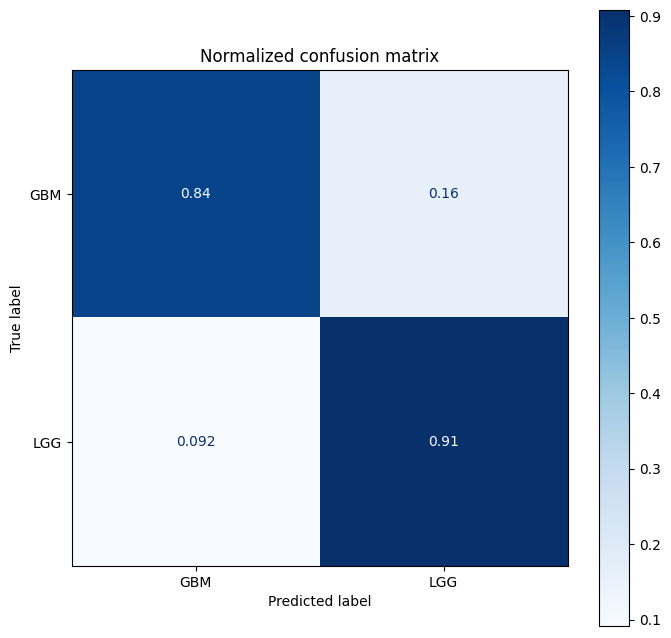

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        lgb_model,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

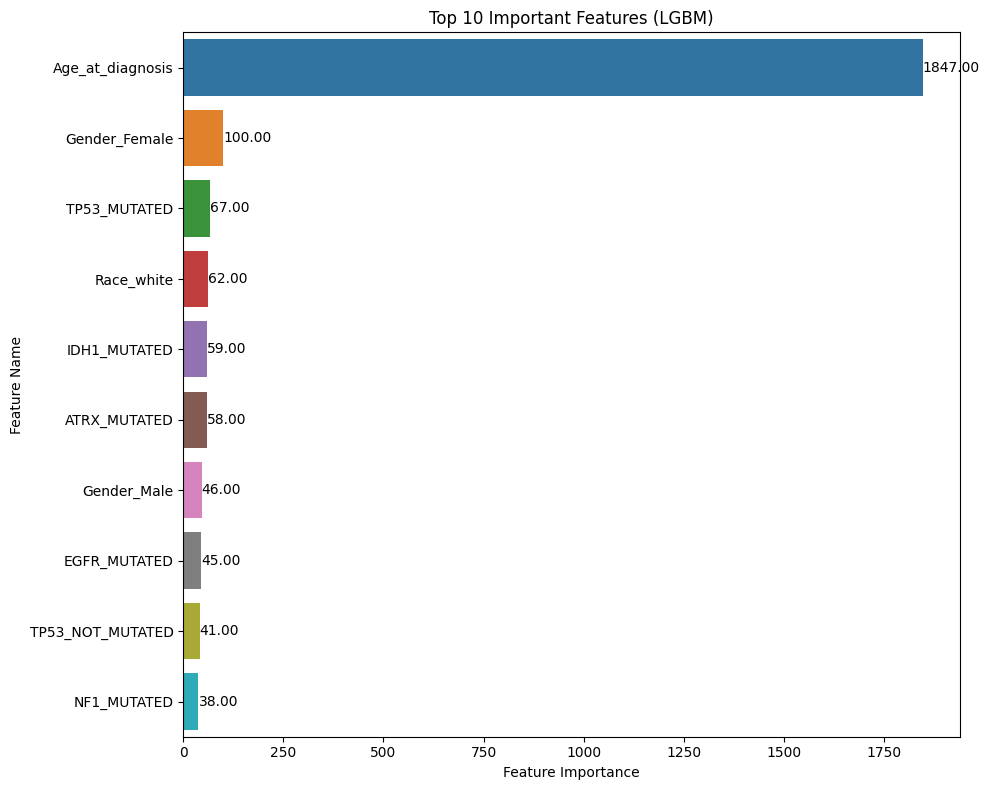

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(lgb_model.feature_importances_, X_train.columns)), columns=['Value', 'Feature'])

# Select the top 10 features with the largest importance values
top_10_features = feature_imp.nlargest(10, 'Value')

plt.figure(figsize=(10, 8))
ax = sns.barplot(x="Value", y="Feature", data=top_10_features)
plt.title('Top 10 Important Features (LGBM)')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')

# Annotate each bar with its value
for index, value in enumerate(top_10_features['Value']):
    ax.text(value, index, f'{value:.2f}', ha='left', va='center')

plt.tight_layout()
plt.show()


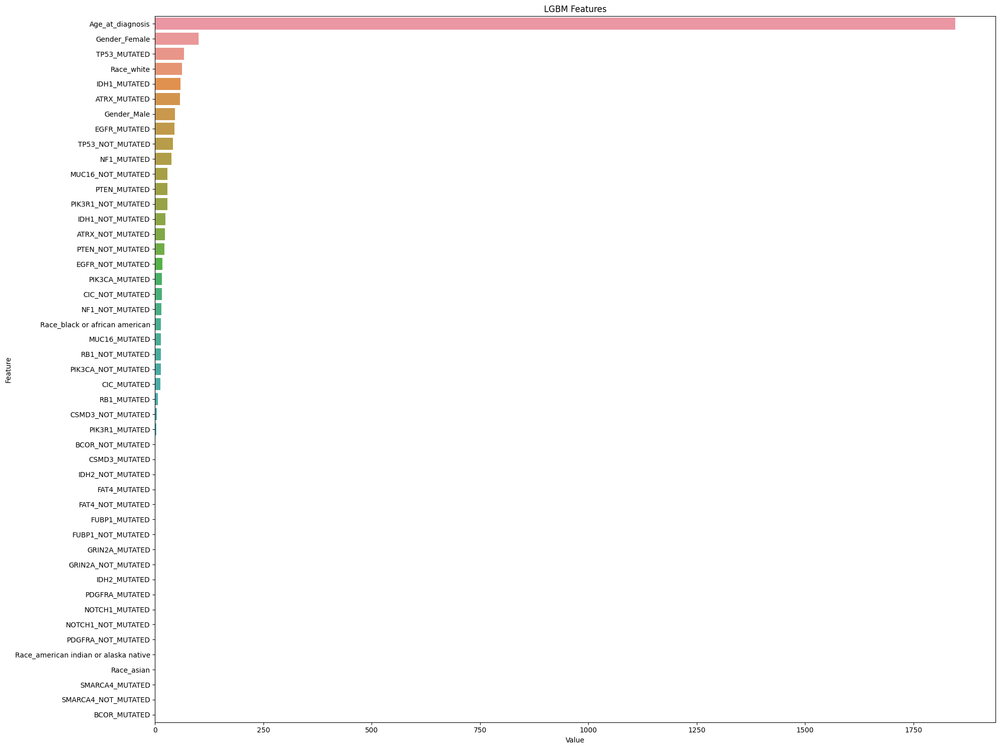

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(lgb_model.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 15))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LGBM Features')
plt.tight_layout()
# plt.savefig('lightgbm_fimp.png')

# LGBM with Optuna

In [ ]:
experiment_name = "LGBM"

tracker = EmissionsTracker(
    output_dir="./code_carbon/",
    output_file=f"{experiment_name}_emissions.csv",
    log_level="error",  # comment out this line to see regular output
)
tracker.start()



In [ ]:
def objective(trial):
    """
    Objective function to be minimized.
    """
    param = {
        "objective": "binary",
        "metric": "binary_logloss",
        "verbosity": -1,
        "boosting_type": "gbdt",
        "num_class": 1,
        "lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 2, 256),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
    }
    gbm = lgb.LGBMClassifier(**param)
    # gbm.fit(X_train, y_train)
    # preds = gbm.predict(X_test)
    # accuracy = accuracy_score(y_test, preds)
    return np.mean(cross_val_score(gbm, X, train_targets, cv=5, scoring='accuracy', verbose=0)) * 100#accuracy

In [ ]:
sampler = TPESampler(seed=1)
study = optuna.create_study(study_name="lightgbm", direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=1000)

[I 2023-10-15 19:21:42,475] A new study created in memory with name: lightgbm
[I 2023-10-15 19:21:42,587] Trial 0 finished with value: 86.41288850869688 and parameters: {'lambda_l1': 5.6649755830282306e-05, 'lambda_l2': 0.030403280126677572, 'num_leaves': 2, 'feature_fraction': 0.5813995435791038, 'bagging_fraction': 0.48805353449026784, 'bagging_freq': 1, 'min_child_samples': 22}. Best is trial 0 with value: 86.41288850869688.
[I 2023-10-15 19:21:42,694] Trial 1 finished with value: 85.22241231822069 and parameters: {'lambda_l1': 1.2883876209377052e-05, 'lambda_l2': 3.72312200494449e-05, 'num_leaves': 139, 'feature_fraction': 0.6515167086419769, 'bagging_fraction': 0.8111317002380557, 'bagging_freq': 2, 'min_child_samples': 89}. Best is trial 0 with value: 86.41288850869688.
[I 2023-10-15 19:21:42,785] Trial 2 finished with value: 85.34145993726833 and parameters: {'lambda_l1': 1.763958399884789e-08, 'lambda_l2': 0.010819509974097813, 'num_leaves': 108, 'feature_fraction': 0.735213897

In [ ]:
# Evaluate emissions
lgbm_emissions = tracker.stop()
print(f"Emissions from this training run: {lgbm_emissions:.5f} kg CO2eq")

Emissions from this training run: 0.00246 kg CO2eq


In [ ]:
print('Best parameters:', study.best_params)

Best parameters: {'lambda_l1': 2.2984218468288753, 'lambda_l2': 0.3716369813511896, 'num_leaves': 3, 'feature_fraction': 0.9796779147831213, 'bagging_fraction': 0.7006052247701142, 'bagging_freq': 2, 'min_child_samples': 16}


In [ ]:
print('Best value:', study.best_value)

Best value: 87.36669518106645


In [ ]:
print('Best trial:', study.best_trial)

Best trial: FrozenTrial(number=45, state=TrialState.COMPLETE, values=[87.36669518106645], datetime_start=datetime.datetime(2023, 10, 15, 19, 21, 51, 497222), datetime_complete=datetime.datetime(2023, 10, 15, 19, 21, 51, 921677), params={'lambda_l1': 2.2984218468288753, 'lambda_l2': 0.3716369813511896, 'num_leaves': 3, 'feature_fraction': 0.9796779147831213, 'bagging_fraction': 0.7006052247701142, 'bagging_freq': 2, 'min_child_samples': 16}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'lambda_l1': FloatDistribution(high=10.0, log=True, low=1e-08, step=None), 'lambda_l2': FloatDistribution(high=10.0, log=True, low=1e-08, step=None), 'num_leaves': IntDistribution(high=256, log=False, low=2, step=1), 'feature_fraction': FloatDistribution(high=1.0, log=False, low=0.4, step=None), 'bagging_fraction': FloatDistribution(high=1.0, log=False, low=0.4, step=None), 'bagging_freq': IntDistribution(high=7, log=False, low=1, step=1), 'min_child_samples': IntDistribution(hig

In [ ]:
#params = study.best_params
params = study.best_params
params

{'lambda_l1': 2.2984218468288753,
 'lambda_l2': 0.3716369813511896,
 'num_leaves': 3,
 'feature_fraction': 0.9796779147831213,
 'bagging_fraction': 0.7006052247701142,
 'bagging_freq': 2,
 'min_child_samples': 16}

In [ ]:
# Catboost
model_lgb_optuna = lgb.LGBMClassifier(**params)
scores = cross_validate(model_lgb_optuna, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
#model_Cat.fit(X_train, y_train)

AUC
0.9171247451043311 0.012221610018200331
Accuracy
0.8736669518106644 0.006799301824575075
Precision
0.9291243718800233 0.021027225691391337
Recall
0.8481800967809804 0.02933690338064408
F1 score
0.886117089197864 0.008146849736836066


In [ ]:
lgbm_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy after tuning: %.2f%%" % (lgbm_accuracy * 100.0))

Accuracy after tuning: 87.37%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(model_xgb, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.8011267605633803 0.05110641803529238


[LightGBM] [Warning] feature_fraction is set=0.9796779147831213, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9796779147831213
[LightGBM] [Warning] lambda_l2 is set=0.3716369813511896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3716369813511896
[LightGBM] [Warning] lambda_l1 is set=2.2984218468288753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2984218468288753
[LightGBM] [Warning] bagging_fraction is set=0.7006052247701142, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7006052247701142
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] feature_fraction is set=0.9796779147831213, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9796779147831213
[LightGBM] [Warning] lambda_l2 is set=0.3716369813511896, reg_lambda=0.0 will be ignored. 

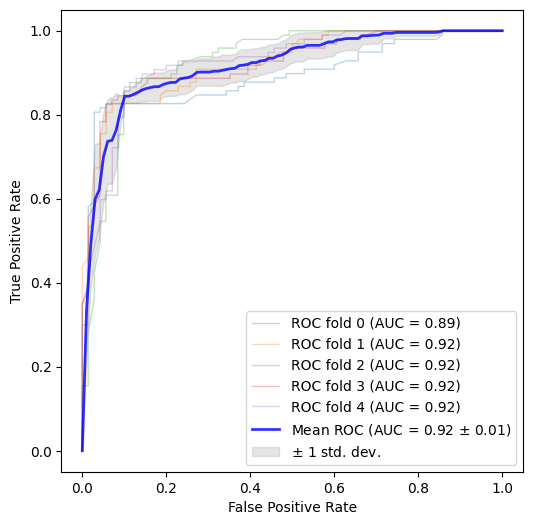

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    model_lgb_optuna.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        model_lgb_optuna,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
model_lgb_optuna = lgb.LGBMClassifier(**params)
model_lgb_optuna.fit(X_train, y_train)
y_pred = model_lgb_optuna.predict(X_test)

[LightGBM] [Warning] feature_fraction is set=0.9796779147831213, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9796779147831213
[LightGBM] [Warning] lambda_l2 is set=0.3716369813511896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3716369813511896
[LightGBM] [Warning] lambda_l1 is set=2.2984218468288753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2984218468288753
[LightGBM] [Warning] bagging_fraction is set=0.7006052247701142, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7006052247701142
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] feature_fraction is set=0.9796779147831213, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9796779147831213
[LightGBM] [Warning] lambda_l2 is set=0.3716369813511896, reg_lambda=0.0 will be ignored. 

[LightGBM] [Warning] feature_fraction is set=0.9796779147831213, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9796779147831213
[LightGBM] [Warning] lambda_l2 is set=0.3716369813511896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3716369813511896
[LightGBM] [Warning] lambda_l1 is set=2.2984218468288753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2984218468288753
[LightGBM] [Warning] bagging_fraction is set=0.7006052247701142, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7006052247701142
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
Confusion matrix, without normalization
[[62  8]
 [12 86]]
[LightGBM] [Warning] feature_fraction is set=0.9796779147831213, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9796779147831213
[LightGBM] [Warning] lambda_l2 is set=0.3716369813511896, reg_lambda=0.0 will be ignored. Current value: lambda

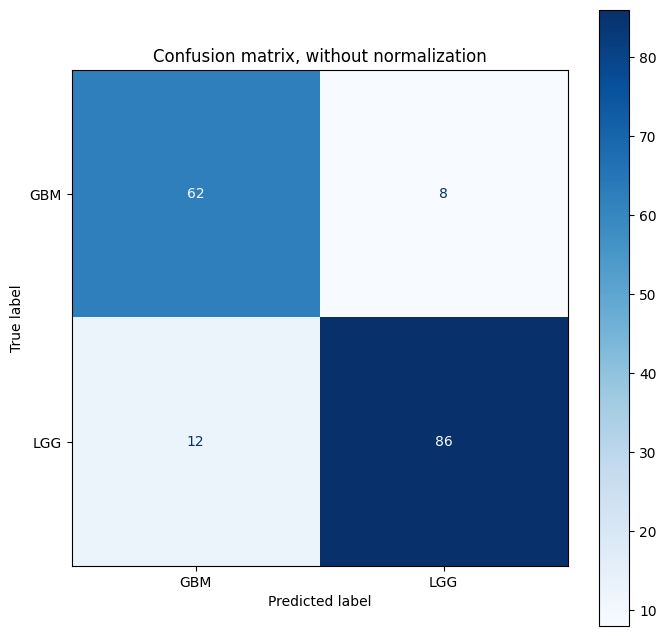

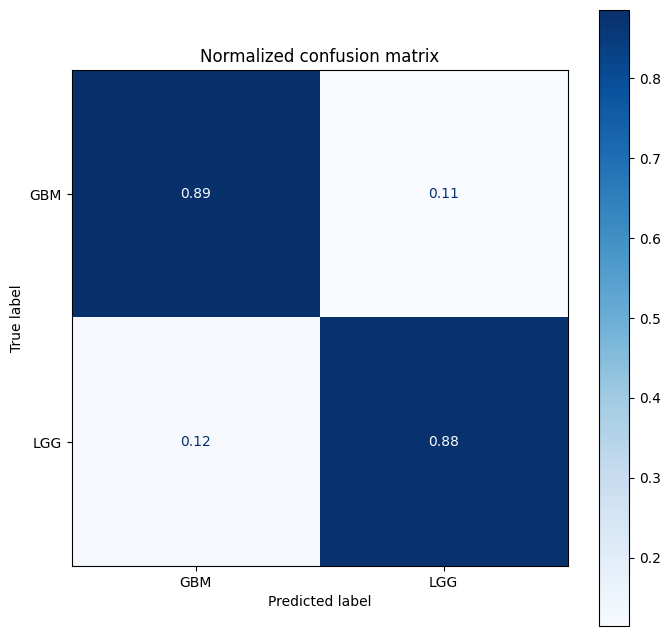

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        model_lgb_optuna,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_lgb_optuna.feature_importances_,X_train.columns)), columns=['Value','Feature'])
feature_imp

,Value,Feature
0,0,ATRX_NOT_MUTATED
1,0,BCOR_MUTATED
2,0,BCOR_NOT_MUTATED
3,0,CSMD3_MUTATED
4,0,CSMD3_NOT_MUTATED
5,0,FAT4_MUTATED
6,0,FAT4_NOT_MUTATED
7,0,FUBP1_MUTATED
8,0,FUBP1_NOT_MUTATED
9,0,GRIN2A_MUTATED


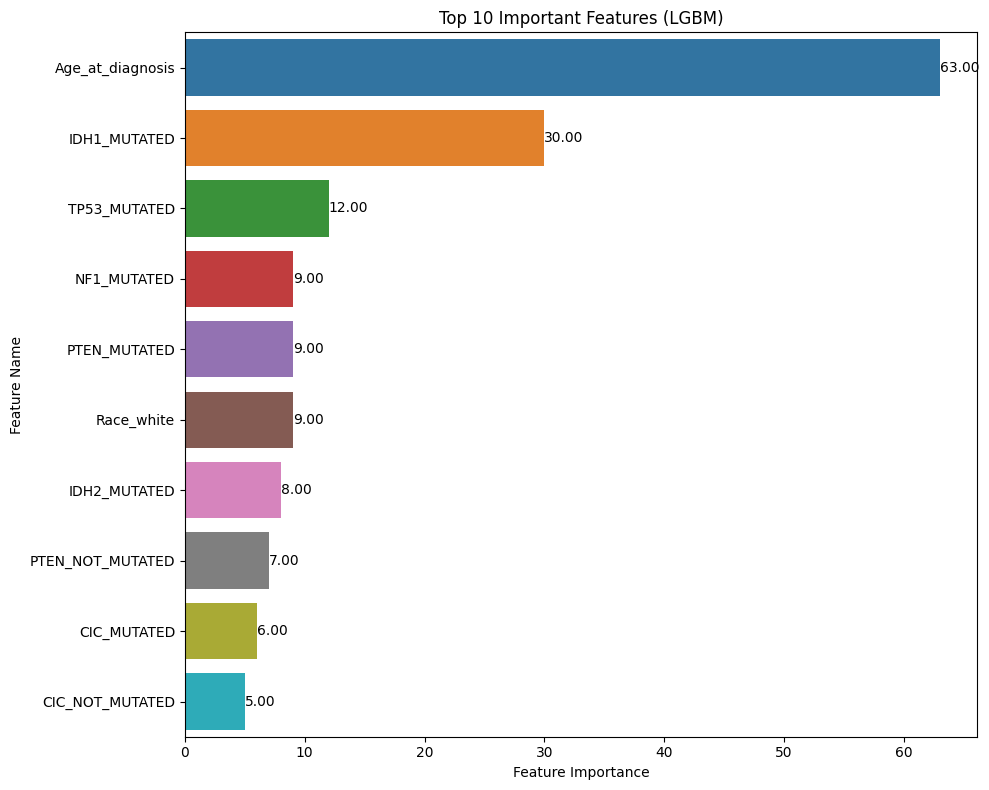

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_lgb_optuna.feature_importances_, X_train.columns)), columns=['Value', 'Feature'])

# Select the top 10 features with the largest importance values
top_10_features = feature_imp.nlargest(10, 'Value')

plt.figure(figsize=(10, 8))
ax = sns.barplot(x="Value", y="Feature", data=top_10_features)
plt.title('Top 10 Important Features (LGBM)')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')

# Annotate each bar with its value
for index, value in enumerate(top_10_features['Value']):
    ax.text(value, index, f'{value:.2f}', ha='left', va='center')

plt.tight_layout()
plt.show()


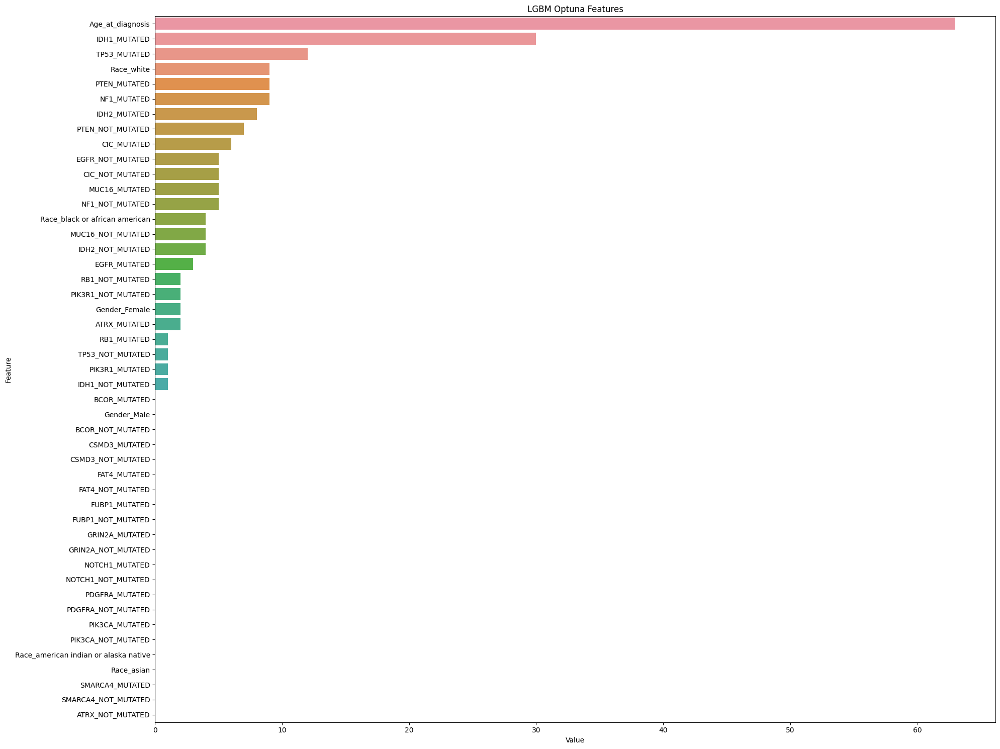

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_lgb_optuna.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 15))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LGBM Optuna Features')
plt.tight_layout()
# plt.savefig('lightgbm_fimp.png')

# Ridge Classifier

In [ ]:
from sklearn.linear_model import RidgeClassifier

In [ ]:
# Catboost
ridge_model = RidgeClassifier()
scores = cross_validate(ridge_model, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
#model_Cat.fit(X_train, y_train)

AUC
0.9124671868789003 0.015275414338385597
Accuracy
0.871300256629598 0.011428957732398775
Precision
0.9386091956098979 0.0191794146224164
Recall
0.8338102251209761 0.03454134831724124
F1 score
0.8823308139221314 0.012913787264284977


In [ ]:
ridge_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy after tuning: %.2f%%" % (ridge_accuracy * 100.0))

Accuracy after tuning: 87.13%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
ridge_model = RidgeClassifier()
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(ridge_model, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.923380281690141 0.026180889826388675


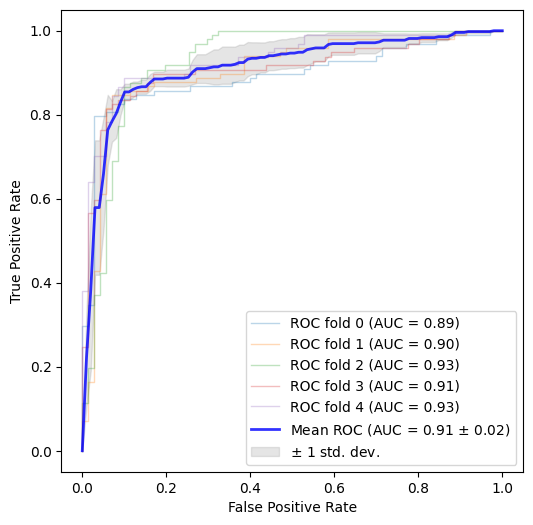

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    ridge_model.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        ridge_model,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
# from sklearn.metrics import recall_score
# from sklearn.metrics import make_scorer
# specificity = make_scorer(recall_score, pos_label=0)
# scores = cross_val_score(model_xgb, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
# print("Specificity")
# print(np.mean(scores), np.std(scores))




# import matplotlib.pyplot as plt

# from sklearn import svm
# from sklearn.metrics import RocCurveDisplay, auc
# from sklearn.model_selection import StratifiedKFold

# n_splits = 5
# cv = StratifiedKFold(n_splits=n_splits)

# tprs = []
# aucs = []
# mean_fpr = np.linspace(0, 1, 100)

# fig, ax = plt.subplots(figsize=(6, 6))
# for fold, (train, test) in enumerate(cv.split(X, train_targets)):
#     model_xgb.fit(X.iloc[train], train_targets.iloc[train])
#     viz = RocCurveDisplay.from_estimator(
#         model_xgb,
#         X.iloc[test],
#         train_targets.iloc[test],
#         name=f"ROC fold {fold}",
#         alpha=0.3,
#         lw=1,
#         ax=ax,
#         #plot_chance_level=True,
#     )
#     interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
#     interp_tpr[0] = 0.0
#     tprs.append(interp_tpr)
#     aucs.append(viz.roc_auc)

# mean_tpr = np.mean(tprs, axis=0)
# mean_tpr[-1] = 1.0
# mean_auc = auc(mean_fpr, mean_tpr)
# std_auc = np.std(aucs)
# ax.plot(
#     mean_fpr,
#     mean_tpr,
#     color="b",
#     label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
#     lw=2,
#     alpha=0.8,
# )

# std_tpr = np.std(tprs, axis=0)
# tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
# tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
# ax.fill_between(
#     mean_fpr,
#     tprs_lower,
#     tprs_upper,
#     color="grey",
#     alpha=0.2,
#     label=r"$\pm$ 1 std. dev.",
# )

# ax.set(
#     xlim=[-0.05, 1.05],
#     ylim=[-0.05, 1.05],
#     xlabel="False Positive Rate",
#     ylabel="True Positive Rate",
#     #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
# )
# ax.axis("square")
# ax.legend(loc="lower right")
# plt.show()

Confusion matrix, without normalization
[[261  21]
 [ 66 323]]
Normalized confusion matrix
[[0.92553191 0.07446809]
 [0.16966581 0.83033419]]


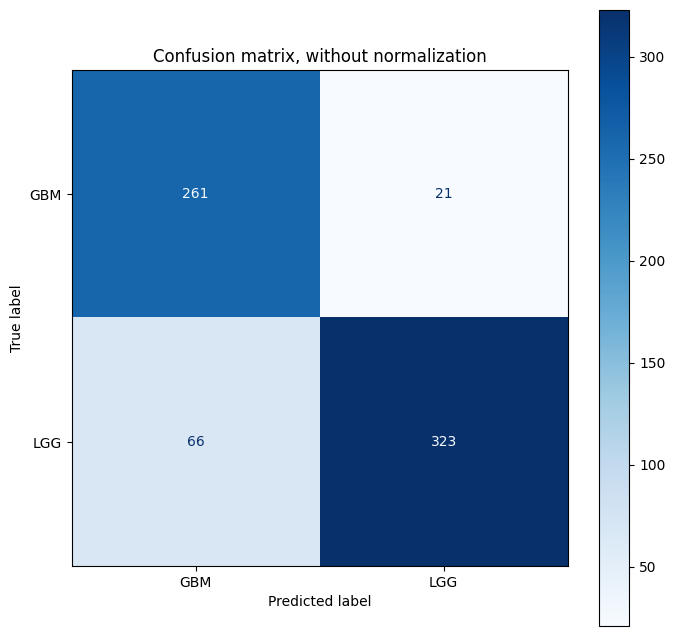

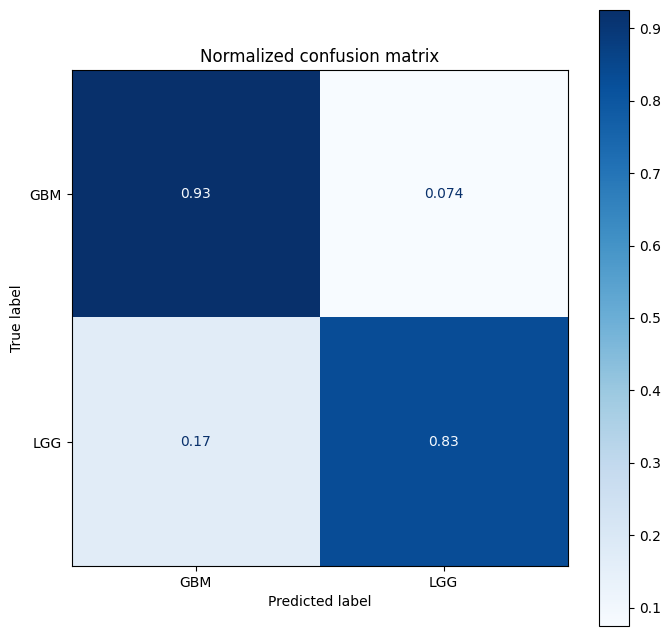

In [ ]:
# # save the target variable classes
# class_names = le_name_map.keys()

# titles_options = [
#     ("Confusion matrix, without normalization", None),
#     ("Normalized confusion matrix", "true"),
# ]
# for title, normalize in titles_options:
#     fig, ax = plt.subplots(figsize=(8, 8))

#     disp = ConfusionMatrixDisplay.from_estimator(
#         ridge_model,
#         X_train,
#         y_train,
#         display_labels=class_names,
#         cmap=plt.cm.Blues,
#         normalize=normalize,
#         ax = ax
#     )
#     disp.ax_.set_title(title)
#     disp.ax_.grid(False)

#     print(title)
#     print(disp.confusion_matrix)

Confusion matrix, without normalization
[[64  6]
 [12 86]]
Normalized confusion matrix
[[0.91428571 0.08571429]
 [0.12244898 0.87755102]]


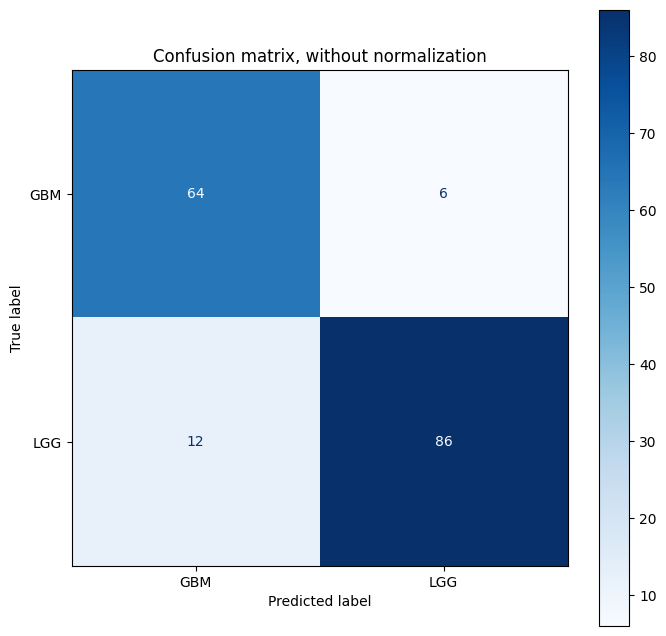

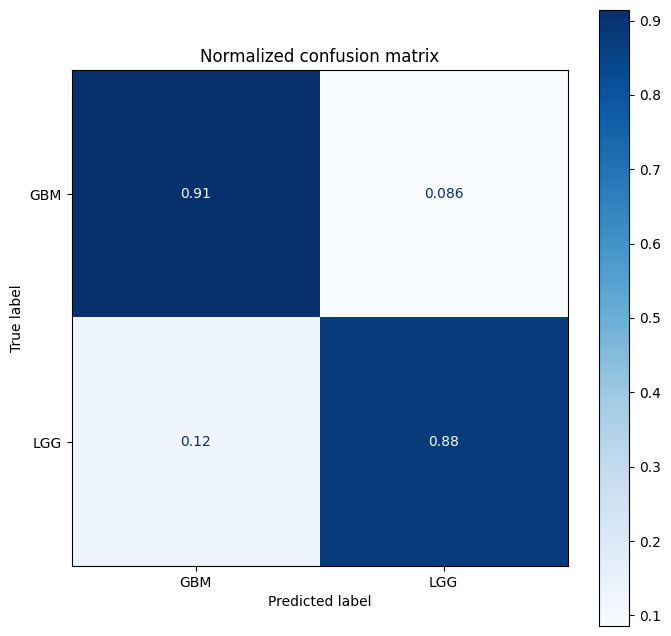

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        ridge_model,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(ridge_model.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 15))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('Ridge Classifier Features')
plt.tight_layout()
# plt.savefig('lightgbm_fimp.png')

AttributeError: ignored

Ridge Classifier with optuna

In [ ]:

experiment_name = "RidgeClassifier"

tracker = EmissionsTracker(
    output_dir="./code_carbon/",
    output_file=f"{experiment_name}_emissions.csv",
    log_level="error",  # comment out this line to see regular output
)
tracker.start()



In [ ]:
# Assuming you have your data in arrays X_train, X_test, y_train, y_test

def objective(trial):
    """
    Objective function to be minimized.
    """
    param = {
        "alpha": trial.suggest_loguniform('alpha', 1e-6, 1.0),
        #"normalize": trial.suggest_categorical('normalize', [True, False]),
    }
    ridge_clf = RidgeClassifier(**param)
    # ridge_clf.fit(X, train_targets)
    # preds = ridge_clf.predict(X_test)
    # accuracy = accuracy_score(y_test, preds)
    return np.mean(cross_val_score(ridge_clf, X, train_targets, cv=5, scoring='accuracy', verbose=0)) * 100#accuracy




In [ ]:
# Create the Optuna study and optimize the objective function
study = optuna.create_study(study_name="ridge-classifier", direction='maximize')
study.optimize(objective, n_trials=1000)



[I 2023-10-16 00:49:05,968] A new study created in memory with name: ridge-classifier
[I 2023-10-16 00:49:06,053] Trial 0 finished with value: 87.1300256629598 and parameters: {'alpha': 0.0006883366656481052}. Best is trial 0 with value: 87.1300256629598.
[I 2023-10-16 00:49:06,186] Trial 1 finished with value: 87.1300256629598 and parameters: {'alpha': 3.4183941360729427e-05}. Best is trial 0 with value: 87.1300256629598.
[I 2023-10-16 00:49:06,326] Trial 2 finished with value: 87.1300256629598 and parameters: {'alpha': 1.0481948093993513e-05}. Best is trial 0 with value: 87.1300256629598.
[I 2023-10-16 00:49:06,470] Trial 3 finished with value: 87.1300256629598 and parameters: {'alpha': 4.179377981465175e-05}. Best is trial 0 with value: 87.1300256629598.
[I 2023-10-16 00:49:06,622] Trial 4 finished with value: 87.1300256629598 and parameters: {'alpha': 0.9890665648211887}. Best is trial 0 with value: 87.1300256629598.
[I 2023-10-16 00:49:06,788] Trial 5 finished with value: 87.13002

In [ ]:
# Evaluate emissions
ridge_emissions = tracker.stop()
print(f"Emissions from this training run: {ridge_emissions:.5f} kg CO2eq")

Emissions from this training run: 0.00081 kg CO2eq


In [ ]:
# Print the best hyperparameters and the best score obtained
print('Best hyperparameters:', study.best_params)
print('Best accuracy:', study.best_value)

Best hyperparameters: {'alpha': 0.6969932662844646}
Best accuracy: 87.1300256629598


In [ ]:
#params = study.best_params
params = study.best_params
params

{'alpha': 0.6969932662844646}

In [ ]:
# Catboost
params = {'alpha': 0.6969932662844646}
model_RidgeC_optuna = RidgeClassifier(**params)
scores = cross_validate(model_RidgeC_optuna, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
#model_Cat.fit(X_train, y_train)

AUC
0.9124969425219527 0.015372791210500772
Accuracy
0.871300256629598 0.011428957732398775
Precision
0.9386091956098979 0.0191794146224164
Recall
0.8338102251209761 0.03454134831724124
F1 score
0.8823308139221314 0.012913787264284977


In [ ]:
ridge_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy after tuning: %.2f%%" % (ridge_accuracy * 100.0))

Accuracy after tuning: 87.13%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(model_RidgeC_optuna, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.923380281690141 0.026180889826388675


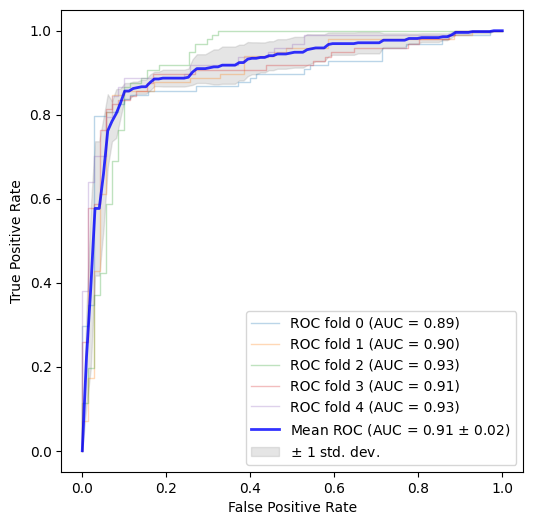

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    model_RidgeC_optuna.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        model_RidgeC_optuna,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
model_RidgeC_optuna = RidgeClassifier(**params)
model_RidgeC_optuna.fit(X_train, y_train)

RidgeClassifier(alpha=0.6969932662844646)

In [ ]:
y_pred = model_RidgeC_optuna.predict(X_test)

Confusion matrix, without normalization
[[64  6]
 [12 86]]
Normalized confusion matrix
[[0.91428571 0.08571429]
 [0.12244898 0.87755102]]


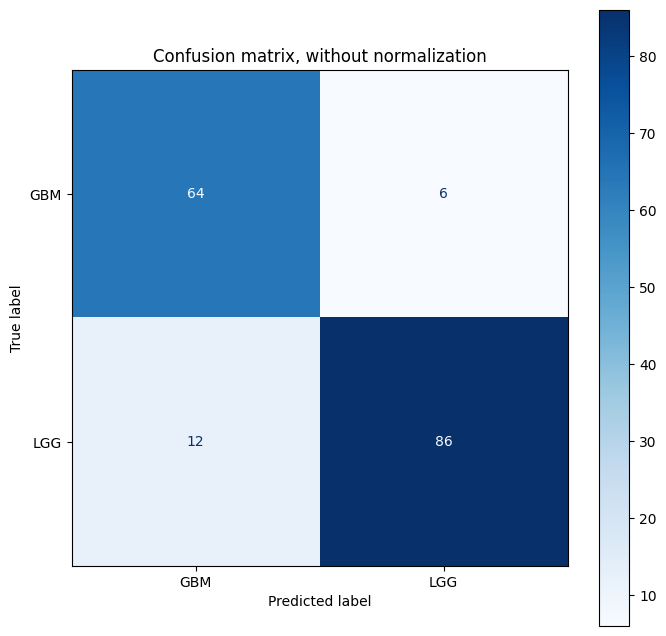

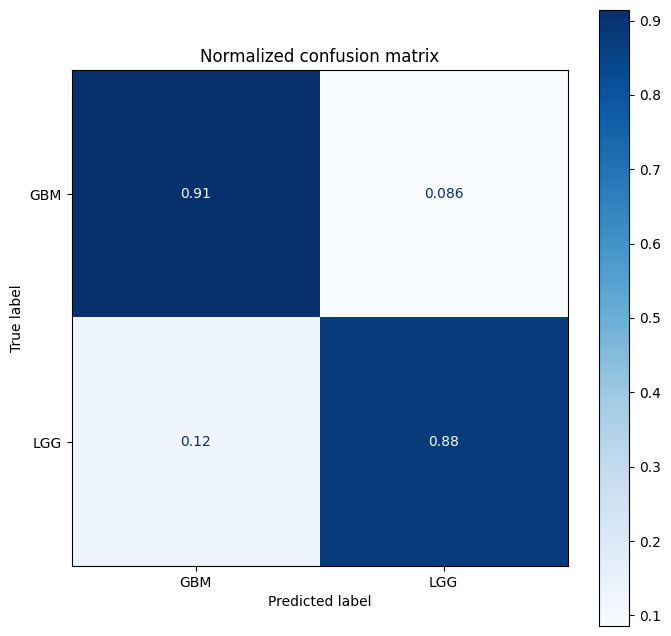

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        model_RidgeC_optuna,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

ExtraTreeclassifier

In [ ]:

# ExtraTreeclassifier
ExtraT_model = ExtraTreesClassifier(random_state=42)
scores = cross_validate(ExtraT_model, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
#model_Cat.fit(X_train, y_train)



AUC
0.8764045645639035 0.018540761726132685
Accuracy
0.8129027658967779 0.02913605742960916
Precision
0.8409001782531194 0.03682493052469326
Recall
0.83782873974332 0.03182144899730106
F1 score
0.8386752298272715 0.02454830448424


In [ ]:
extratree_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy : %.2f%%" % (extratree_accuracy * 100.0))

Accuracy : 81.29%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(ExtraT_model, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.7787525150905432 0.057243315782031665


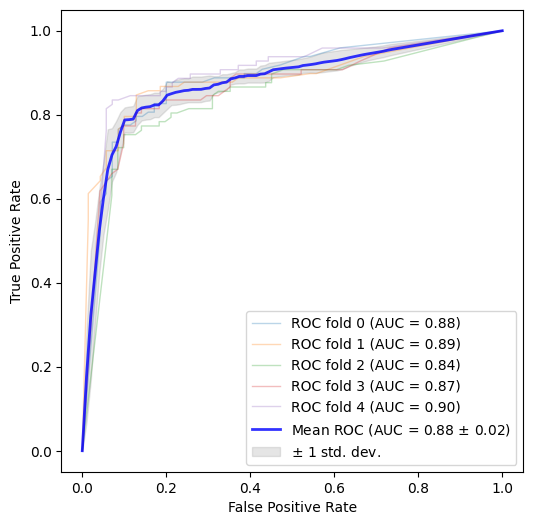

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    ExtraT_model.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        ExtraT_model,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
# ExtraTreeclassifier
ExtraT_model = ExtraTreesClassifier(random_state= 42)
ExtraT_model.fit(X_train, y_train)

ExtraTreesClassifier(random_state=42)

In [ ]:
y_pred = ExtraT_model.predict(X_test)


Confusion matrix, without normalization
[[54 16]
 [ 8 90]]
Normalized confusion matrix
[[0.77142857 0.22857143]
 [0.08163265 0.91836735]]


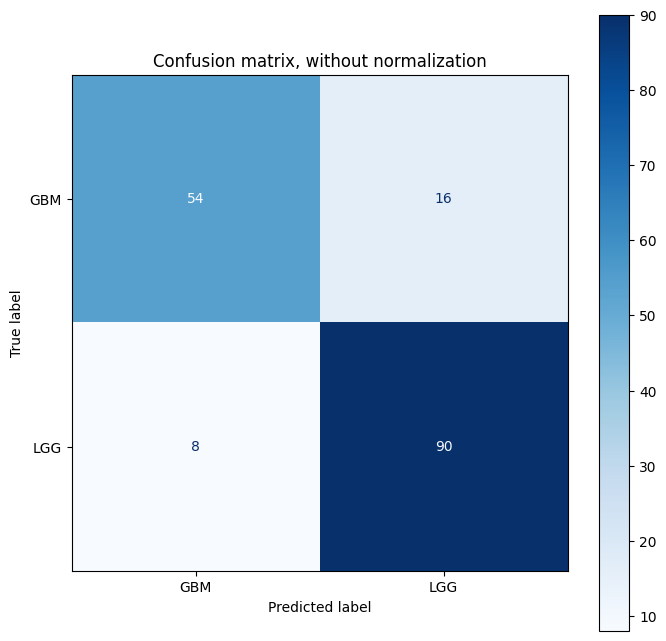

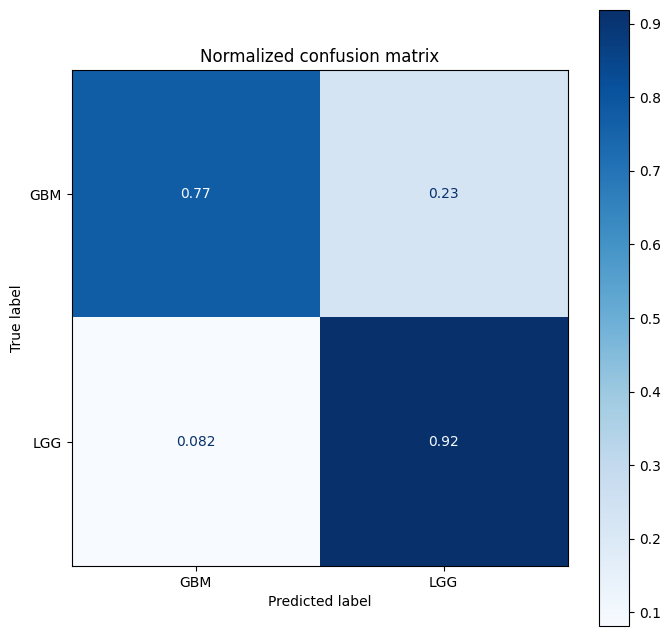

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        ExtraT_model,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

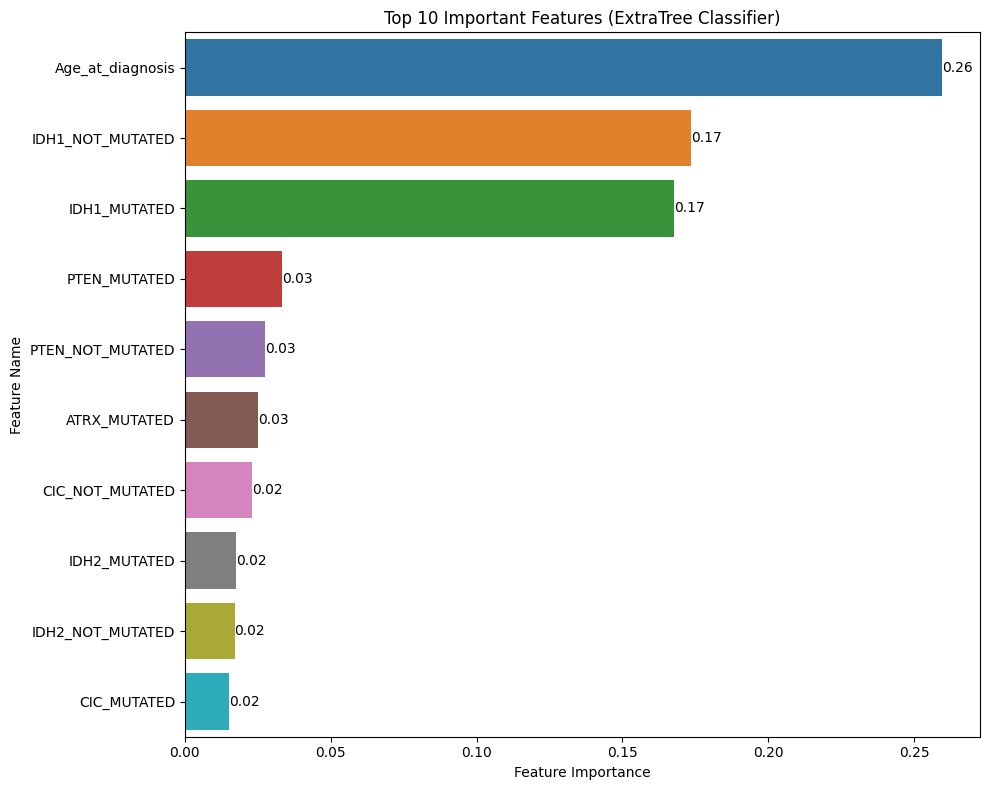

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(ExtraT_model.feature_importances_, X_train.columns)), columns=['Value', 'Feature'])

# Select the top 10 features with the largest importance values
top_10_features = feature_imp.nlargest(10, 'Value')

plt.figure(figsize=(10, 8))
ax = sns.barplot(x="Value", y="Feature", data=top_10_features)
plt.title('Top 10 Important Features (ExtraTree Classifier)')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')

# Annotate each bar with its value
for index, value in enumerate(top_10_features['Value']):
    ax.text(value, index, f'{value:.2f}', ha='left', va='center')

plt.tight_layout()
plt.show()


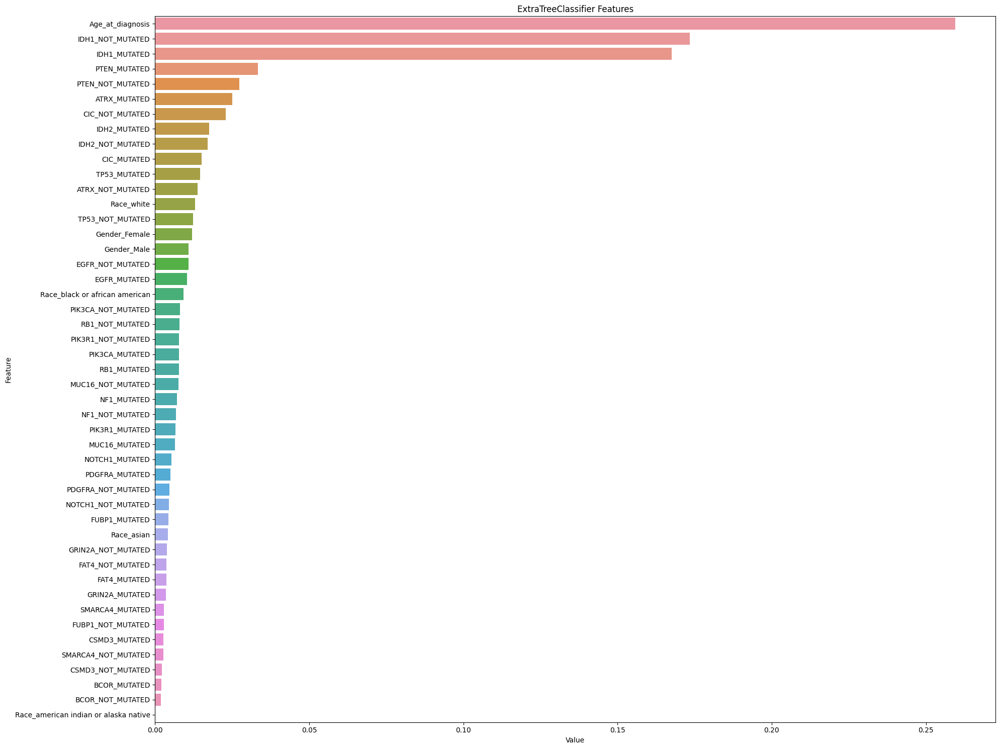

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(ExtraT_model.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 15))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('ExtraTreeClassifier Features')
plt.tight_layout()
# plt.savefig('lightgbm_fimp.png')

ExtraTreeClassifier with Optuna

In [ ]:
# def objective(trial):
#     # Define the hyperparameters to be tuned
#     n_estimators = trial.suggest_int('n_estimators', 100, 1000, step=100)
#     max_depth = trial.suggest_int('max_depth', 3, 20)

#     # Create the ExtraTreesClassifier model with the sampled hyperparameters
#     model = ExtraTreesClassifier(n_estimators=n_estimators, max_depth=max_depth)

#     # Perform cross-validation and calculate the mean accuracy
#     scores = cross_val_score(model, X_train, y_train, cv=10)
#     accuracy = scores.mean()

#     # Return the negative accuracy as Optuna minimizes the objective function
#     return accuracy

# # Create the Optuna study and optimize the objective function
# study = optuna.create_study(direction='maximize')
# study.optimize(objective, n_trials=300)

# # Print the best hyperparameters and the best score obtained
# print('Best hyperparameters:', study.best_params)
# print('Best accuracy:', study.best_value)


In [ ]:
experiment_name = "ExtratreeClassifier"

tracker = EmissionsTracker(
    output_dir="./code_carbon/",
    output_file=f"{experiment_name}_emissions.csv",
    log_level="error",  # comment out this line to see regular output
)
tracker.start()



In [ ]:
def objective(trial):
    """
    Objective function to be minimized.
    """
    param = {
        'n_estimators' : trial.suggest_int('n_estimators', 100, 1000, step=100),
        'max_depth' : trial.suggest_int('max_depth', 3, 20)


    }
    model = ExtraTreesClassifier(**param, random_state=42)
    # model.fit(X_train, y_train)
    # preds = model.predict(X_test)
    # accuracy = accuracy_score(y_test, preds)
    return np.mean(cross_val_score(model, X, train_targets, cv=5, scoring='accuracy', verbose=0)) * 100#accuracy



In [ ]:
# Create the Optuna study and optimize the objective function
study = optuna.create_study(study_name="ExtraTree",direction='maximize')
study.optimize(objective, n_trials=500)



[I 2023-10-16 01:09:52,918] A new study created in memory with name: ExtraTree
[I 2023-10-16 01:10:02,521] Trial 0 finished with value: 87.36883376104933 and parameters: {'n_estimators': 1000, 'max_depth': 9}. Best is trial 0 with value: 87.36883376104933.
[I 2023-10-16 01:10:06,229] Trial 1 finished with value: 84.86455660108355 and parameters: {'n_estimators': 400, 'max_depth': 16}. Best is trial 0 with value: 87.36883376104933.
[I 2023-10-16 01:10:12,243] Trial 2 finished with value: 86.77288280581695 and parameters: {'n_estimators': 800, 'max_depth': 10}. Best is trial 0 with value: 87.36883376104933.
[I 2023-10-16 01:10:16,960] Trial 3 finished with value: 87.60692899914456 and parameters: {'n_estimators': 500, 'max_depth': 6}. Best is trial 3 with value: 87.60692899914456.
[I 2023-10-16 01:10:22,759] Trial 4 finished with value: 86.77288280581695 and parameters: {'n_estimators': 600, 'max_depth': 10}. Best is trial 3 with value: 87.60692899914456.
[I 2023-10-16 01:10:27,993] Tria

In [ ]:
# Evaluate emissions
extratree_emissions = tracker.stop()
print(f"Emissions from this training run: {extratree_emissions:.5f} kg CO2eq")

Emissions from this training run: 0.00804 kg CO2eq


In [ ]:
extratree_emissions

0.008038289864436374

In [ ]:
# Print the best hyperparameters and the best score obtained
print('Best hyperparameters:', study.best_params)
print('Best accuracy:', study.best_value)

Best hyperparameters: {'n_estimators': 500, 'max_depth': 6}
Best accuracy: 87.60692899914456


In [ ]:
params = study.best_params
# params = {
#     'max_depth' : 7,
#     'n_estimators' : 1000
# }
params

{'n_estimators': 500, 'max_depth': 6}

In [ ]:
#params = {'n_estimators': 500, 'max_depth': 7}
model_ExtraT_optuna = ExtraTreesClassifier(**params, random_state = 42)
scores = cross_validate(model_ExtraT_optuna, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))

AUC
0.9177522213017216 0.01150747595955642
Accuracy
0.8760692899914456 0.011915066169161187
Precision
0.9388464786423569 0.01474931387846032
Recall
0.8419945297706712 0.03232837373151876
F1 score
0.8871911925039063 0.013013613293519974


In [ ]:
# # Catboost
# model_ExtraT_optuna = ExtraTreesClassifier(**params)
# scores = cross_validate(model_ExtraT_optuna, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
# print("AUC")
# print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
# print("Accuracy")
# print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
# print("Precision")
# print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
# print("Recall")
# print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
# print("F1 score")
# print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
# #model_Cat.fit(X_train, y_train)

AUC
0.918903448039383 0.01054057471632028
Accuracy
0.8748788138009695 0.012254944496280404
Precision
0.9365928625770616 0.015286120818899764
Recall
0.8419734904270987 0.02975326214149153
F1 score
0.8862738973893082 0.012882298499467534


In [ ]:
extratree_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy after tuning: %.2f%%" % (extratree_accuracy * 100.0))

Accuracy after tuning: 87.61%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(model_ExtraT_optuna, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.9233400402414487 0.02114074462933575


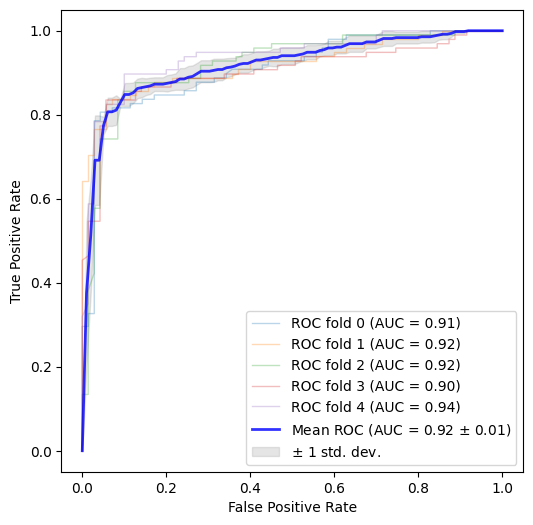

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    model_ExtraT_optuna.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        model_ExtraT_optuna,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
# # Catboost
# model_ExtraT_optuna = ExtraTreesClassifier(**params)
# scores = cross_validate(model_ExtraT_optuna, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
# print("AUC")
# print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
# print("Accuracy")
# print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
# print("Precision")
# print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
# print("Recall")
# print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
# print("F1 score")
# print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
# #model_Cat.fit(X_train, y_train)

# ridge_accuracy = np.mean(scores['test_accuracy'])
# print("Accuracy after tuning: %.2f%%" % (ridge_accuracy * 100.0))

In [ ]:
model_ExtraT_optuna = ExtraTreesClassifier(**params)
model_ExtraT_optuna.fit(X_train, y_train)

ExtraTreesClassifier(max_depth=6, n_estimators=500)

In [ ]:
y_pred = model_ExtraT_optuna.predict(X_test)

Confusion matrix, without normalization
[[64  6]
 [12 86]]
Normalized confusion matrix
[[0.91428571 0.08571429]
 [0.12244898 0.87755102]]


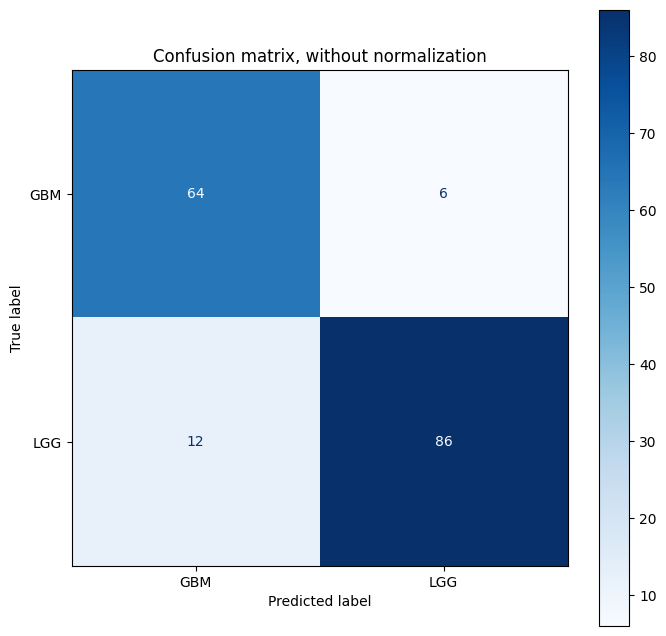

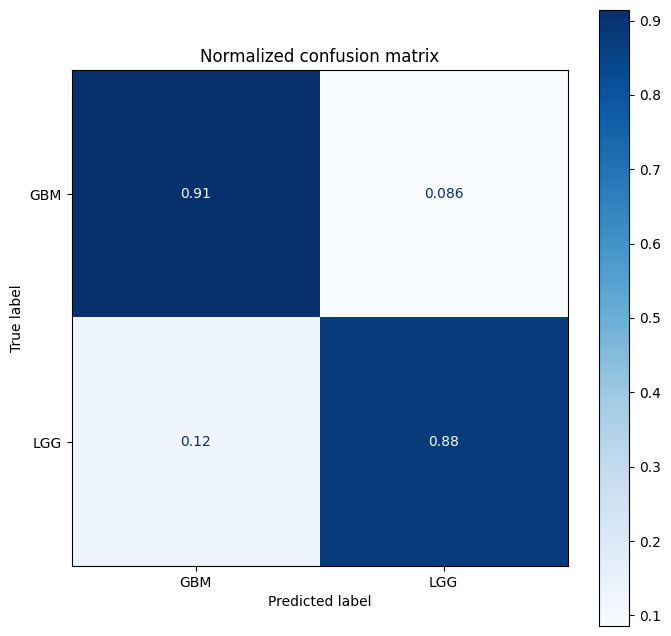

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        model_ExtraT_optuna,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_ExtraT_optuna.feature_importances_,X_train.columns)), columns=['Value','Feature'])
feature_imp

,Value,Feature
0,0.000000,Race_american indian or alaska native
1,0.000461,BCOR_NOT_MUTATED
2,0.000462,BCOR_MUTATED
3,0.000578,CSMD3_NOT_MUTATED
4,0.000735,CSMD3_MUTATED
5,0.001275,SMARCA4_NOT_MUTATED
6,0.001451,SMARCA4_MUTATED
7,0.001629,GRIN2A_NOT_MUTATED
8,0.001712,PDGFRA_NOT_MUTATED
9,0.001737,PIK3CA_NOT_MUTATED


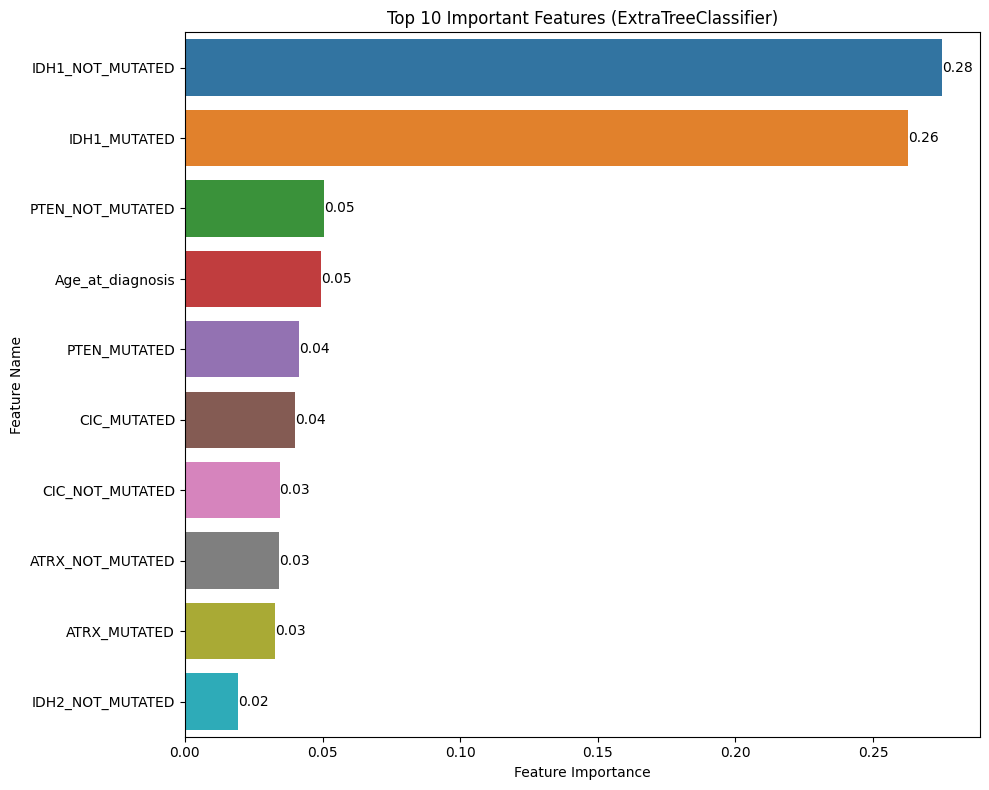

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_ExtraT_optuna.feature_importances_, X_train.columns)), columns=['Value', 'Feature'])

# Select the top 10 features with the largest importance values
top_10_features = feature_imp.nlargest(10, 'Value')

plt.figure(figsize=(10, 8))
ax = sns.barplot(x="Value", y="Feature", data=top_10_features)
plt.title('Top 10 Important Features (ExtraTreeClassifier)')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')

# Annotate each bar with its value
for index, value in enumerate(top_10_features['Value']):
    ax.text(value, index, f'{value:.2f}', ha='left', va='center')

plt.tight_layout()
plt.show()


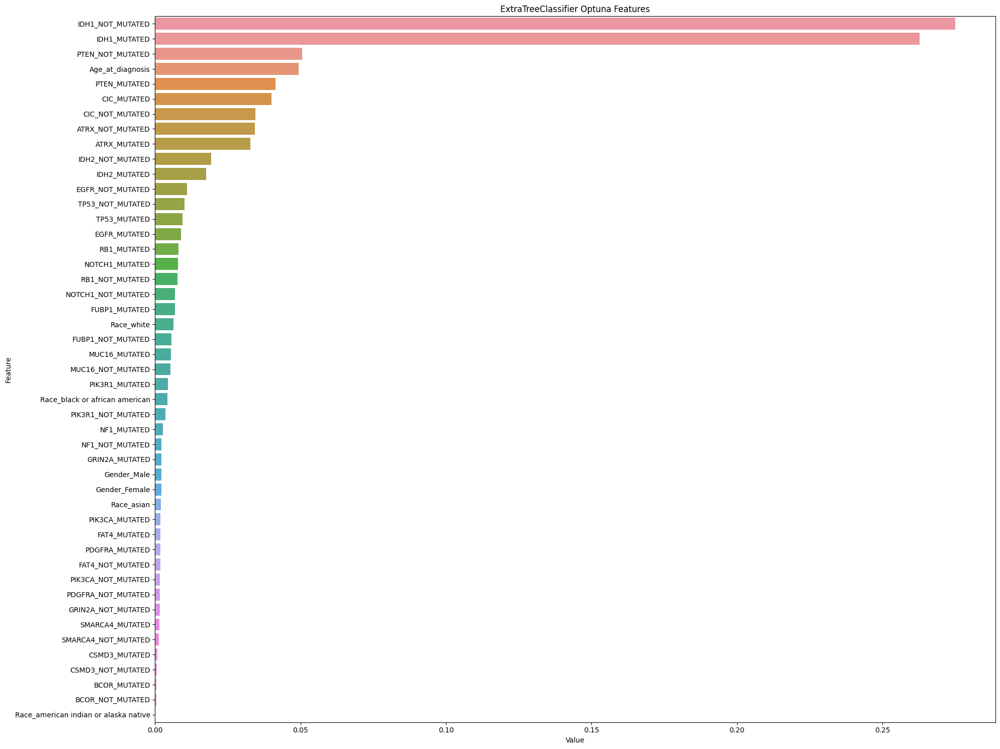

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_ExtraT_optuna.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 15))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('ExtraTreeClassifier Optuna Features')
plt.tight_layout()
# plt.savefig('lightgbm_fimp.png')

# Random Forest

In [ ]:
# # ExtraTreeclassifier
# RandomF_model = RandomForestClassifier(random_state=42)
# RandomF_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# Catboost
RandomF_model = RandomForestClassifier(random_state=42)
scores = cross_validate(RandomF_model, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
#model_Cat.fit(X_train, y_train)

AUC
0.8964060525577195 0.014882838707348845
Accuracy
0.833162246934702 0.017830699079975868
Precision
0.8694365010714087 0.03948604891052728
Recall
0.8420155691142437 0.035904760181777254
F1 score
0.8541346636198627 0.015009254998080961


In [ ]:
rf_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy : %.2f%%" % (rf_accuracy * 100.0))

Accuracy : 83.32%


In [ ]:
# # Catboost
# model_ExtraT_optuna = ExtraTreesClassifier(**params)
# scores = cross_validate(model_ExtraT_optuna, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
# print("AUC")
# print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
# print("Accuracy")
# print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
# print("Precision")
# print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
# print("Recall")
# print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
# print("F1 score")
# print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
# #model_Cat.fit(X_train, y_train)

# ridge_accuracy = np.mean(scores['test_accuracy'])
# print("Accuracy after tuning: %.2f%%" % (ridge_accuracy * 100.0))

In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(RandomF_model, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.821327967806841 0.060482910771346515


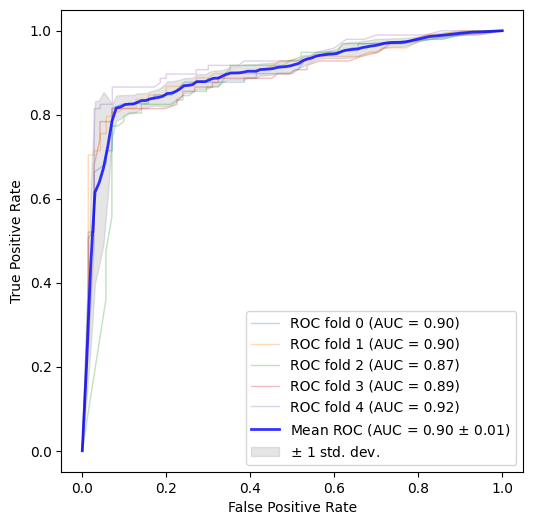

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    RandomF_model.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        RandomF_model,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
# ExtraTreeclassifier
RandomF_model = RandomForestClassifier(random_state=42)
RandomF_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
y_pred = RandomF_model.predict(X_test)

Confusion matrix, without normalization
[[54 16]
 [10 88]]
Normalized confusion matrix
[[0.77142857 0.22857143]
 [0.10204082 0.89795918]]


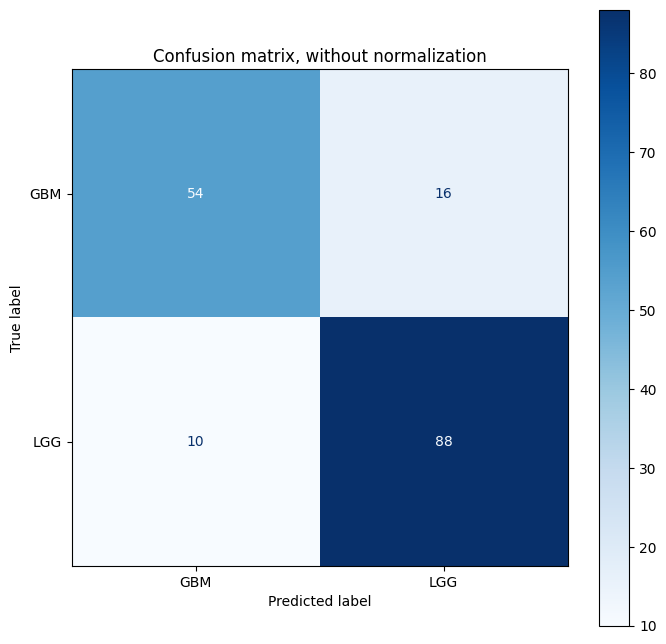

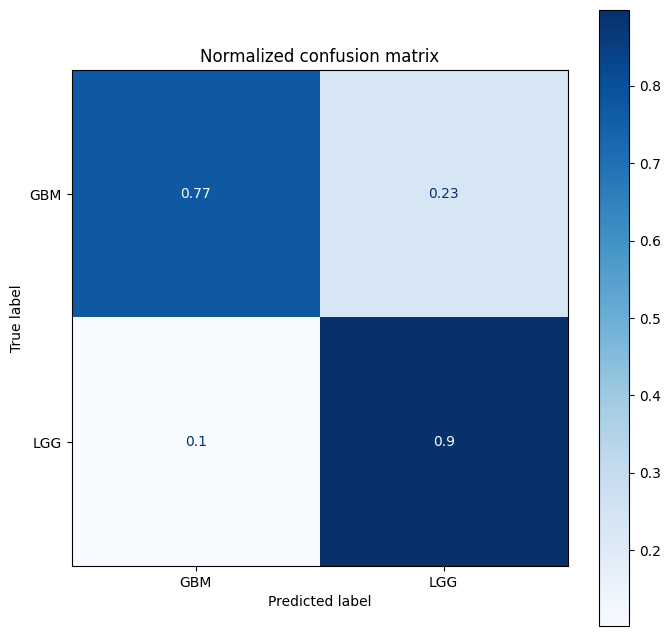

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        RandomF_model,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

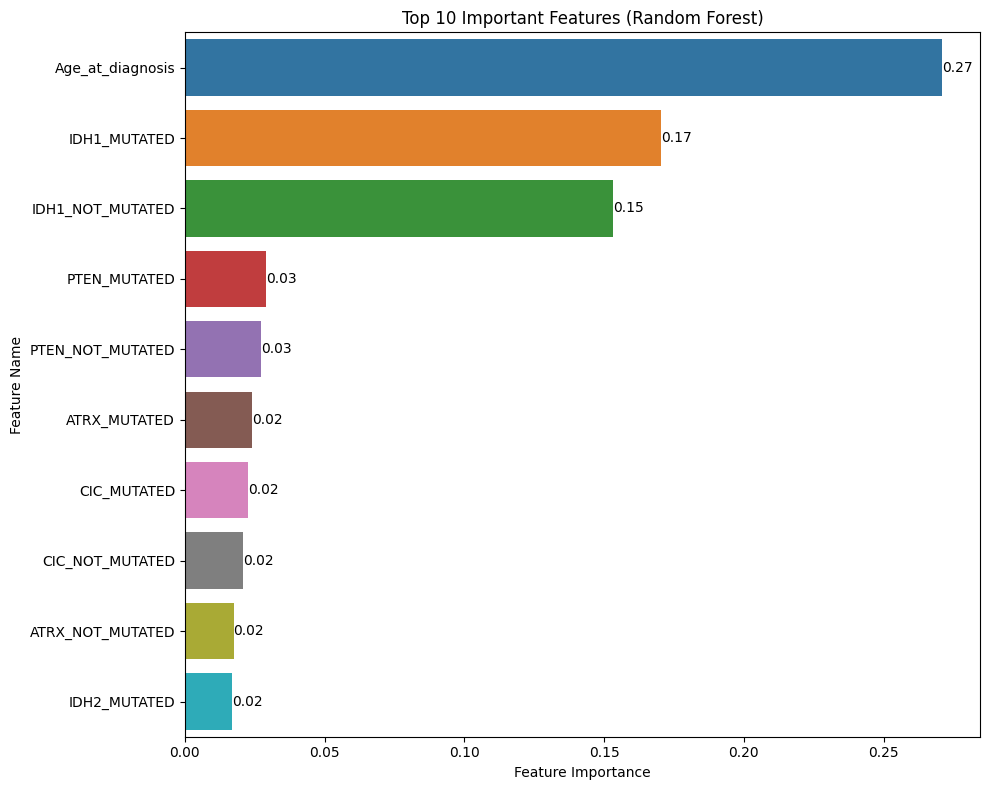

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(RandomF_model.feature_importances_, X_train.columns)), columns=['Value', 'Feature'])

# Select the top 10 features with the largest importance values
top_10_features = feature_imp.nlargest(10, 'Value')

plt.figure(figsize=(10, 8))
ax = sns.barplot(x="Value", y="Feature", data=top_10_features)
plt.title('Top 10 Important Features (Random Forest)')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')

# Annotate each bar with its value
for index, value in enumerate(top_10_features['Value']):
    ax.text(value, index, f'{value:.2f}', ha='left', va='center')

plt.tight_layout()
plt.show()


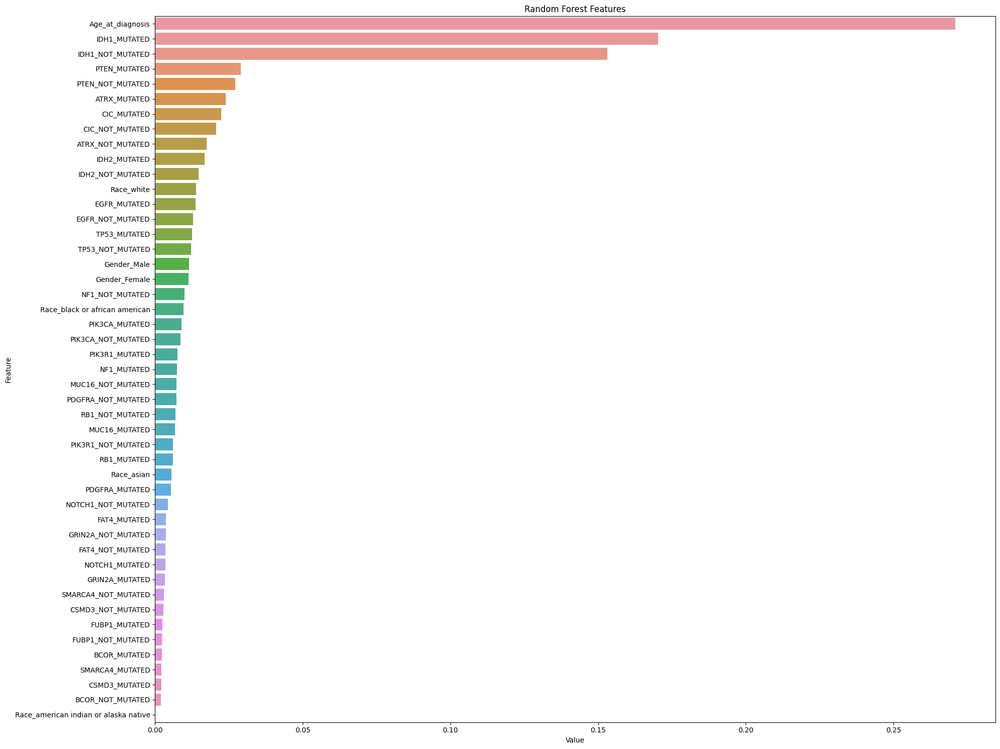

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(RandomF_model.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 15))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('Random Forest Features')
plt.tight_layout()
# plt.savefig('lightgbm_fimp.png')

Random Forest with Optuna

In [ ]:
# rf_params = {'n_estimators': [100, 150, 300],
#              'min_samples_split': [2, 3, 4],
#              'min_samples_leaf': [1, 2, 3]}

In [ ]:
experiment_name = "RandomForest"

tracker = EmissionsTracker(
    output_dir="./code_carbon/",
    output_file=f"{experiment_name}_emissions.csv",
    log_level="error",  # comment out this line to see regular output
)
tracker.start()



In [ ]:
def objective(trial):
    """
    Objective function to be minimized.
    """
    param = {
        'n_estimators' : trial.suggest_int('n_estimators', 100, 500, step=25),
        'min_samples_split' : trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf' : trial.suggest_int('min_samples_leaf', 2, 10),

    }
    model = RandomForestClassifier(**param)
    # model.fit(X_train, y_train)
    # preds = model.predict(X_test)
    # accuracy = accuracy_score(y_test, preds)
    return np.mean(cross_val_score(model, X, train_targets, cv=5, scoring='accuracy', verbose=0)) * 100#accuracy



In [ ]:
# Create the Optuna study and optimize the objective function
study = optuna.create_study(study_name = 'RandomForest',direction='maximize')
study.optimize(objective, n_trials=1000)



[I 2023-10-15 23:33:59,296] A new study created in memory with name: RandomForest
[I 2023-10-15 23:34:00,887] Trial 0 finished with value: 87.01169090390646 and parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 3}. Best is trial 0 with value: 87.01169090390646.
[I 2023-10-15 23:34:08,351] Trial 1 finished with value: 86.89193042486455 and parameters: {'n_estimators': 400, 'min_samples_split': 6, 'min_samples_leaf': 9}. Best is trial 0 with value: 87.01169090390646.
[I 2023-10-15 23:34:11,945] Trial 2 finished with value: 87.01169090390648 and parameters: {'n_estimators': 200, 'min_samples_split': 9, 'min_samples_leaf': 7}. Best is trial 2 with value: 87.01169090390648.
[I 2023-10-15 23:34:17,499] Trial 3 finished with value: 86.89193042486455 and parameters: {'n_estimators': 450, 'min_samples_split': 3, 'min_samples_leaf': 9}. Best is trial 2 with value: 87.01169090390648.
[I 2023-10-15 23:34:18,995] Trial 4 finished with value: 86.77145708582835 and paramet

In [ ]:
# Evaluate emissions
rf_emissions = tracker.stop()
print(f"Emissions from this training run: {rf_emissions:.5f} kg CO2eq")

Emissions from this training run: 0.02799 kg CO2eq


In [ ]:
# Print the best hyperparameters and the best score obtained
print('Best hyperparameters:', study.best_params)
print('Best accuracy:', study.best_value)

Best hyperparameters: {'n_estimators': 250, 'min_samples_split': 6, 'min_samples_leaf': 2}
Best accuracy: 87.72597661819219


In [ ]:
# best_params = study.best_params
# accuracy = best_params["accuracy"]
# standard_deviation = study.best_value - accuracy

# print("Accuracy: {} +- {}".format(accuracy, standard_deviation))

In [ ]:
#params = study.best_params
params = study.best_params
params

{'n_estimators': 250, 'min_samples_split': 6, 'min_samples_leaf': 2}

In [ ]:
# ExtraTreeclassifier
model_RandomF_optuna = RandomForestClassifier(**params, random_state=42)
scores = cross_validate(model_RandomF_optuna, X, train_targets , scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ],n_jobs = -1,cv = 5)
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
#model_Cat.fit(X_train, y_train)



AUC
0.9166537813034317 0.013211668671543197
Accuracy
0.8701026518391789 0.010021670676093407
Precision
0.9306082375478926 0.01833628572935603
Recall
0.839974752787713 0.036433036129703764
F1 score
0.88210678730293 0.012170117932364777


In [ ]:
rf_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy after tuning: %.2f%%" % (rf_accuracy * 100.0))

Accuracy after tuning: 87.01%


In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(model_RandomF_optuna, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

Specificity
0.9119517102615695 0.027617070329606582


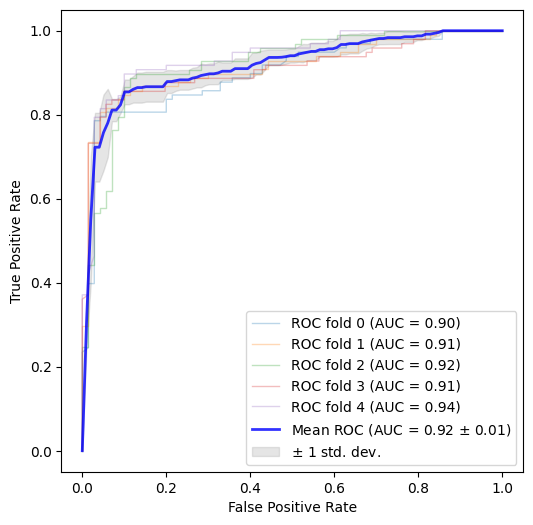

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    model_RandomF_optuna.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        model_RandomF_optuna,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
# from sklearn.metrics import recall_score
# from sklearn.metrics import make_scorer
# specificity = make_scorer(recall_score, pos_label=0)
# scores = cross_val_score(model_xgb, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
# print("Specificity")
# print(np.mean(scores), np.std(scores))




# import matplotlib.pyplot as plt

# from sklearn import svm
# from sklearn.metrics import RocCurveDisplay, auc
# from sklearn.model_selection import StratifiedKFold

# n_splits = 5
# cv = StratifiedKFold(n_splits=n_splits)

# tprs = []
# aucs = []
# mean_fpr = np.linspace(0, 1, 100)

# fig, ax = plt.subplots(figsize=(6, 6))
# for fold, (train, test) in enumerate(cv.split(X, train_targets)):
#     model_xgb.fit(X.iloc[train], train_targets.iloc[train])
#     viz = RocCurveDisplay.from_estimator(
#         model_xgb,
#         X.iloc[test],
#         train_targets.iloc[test],
#         name=f"ROC fold {fold}",
#         alpha=0.3,
#         lw=1,
#         ax=ax,
#         #plot_chance_level=True,
#     )
#     interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
#     interp_tpr[0] = 0.0
#     tprs.append(interp_tpr)
#     aucs.append(viz.roc_auc)

# mean_tpr = np.mean(tprs, axis=0)
# mean_tpr[-1] = 1.0
# mean_auc = auc(mean_fpr, mean_tpr)
# std_auc = np.std(aucs)
# ax.plot(
#     mean_fpr,
#     mean_tpr,
#     color="b",
#     label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
#     lw=2,
#     alpha=0.8,
# )

# std_tpr = np.std(tprs, axis=0)
# tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
# tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
# ax.fill_between(
#     mean_fpr,
#     tprs_lower,
#     tprs_upper,
#     color="grey",
#     alpha=0.2,
#     label=r"$\pm$ 1 std. dev.",
# )

# ax.set(
#     xlim=[-0.05, 1.05],
#     ylim=[-0.05, 1.05],
#     xlabel="False Positive Rate",
#     ylabel="True Positive Rate",
#     #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
# )
# ax.axis("square")
# ax.legend(loc="lower right")
# plt.show()

In [ ]:
model_RandomF_optuna = RandomForestClassifier(**params, random_state=42)
model_RandomF_optuna.fit(X_train, y_train)

RandomForestClassifier(min_samples_leaf=2, min_samples_split=6,
                       n_estimators=250, random_state=42)

In [ ]:
y_pred = model_RandomF_optuna.predict(X_test)



Confusion matrix, without normalization
[[64  6]
 [11 87]]
Normalized confusion matrix
[[0.91428571 0.08571429]
 [0.1122449  0.8877551 ]]


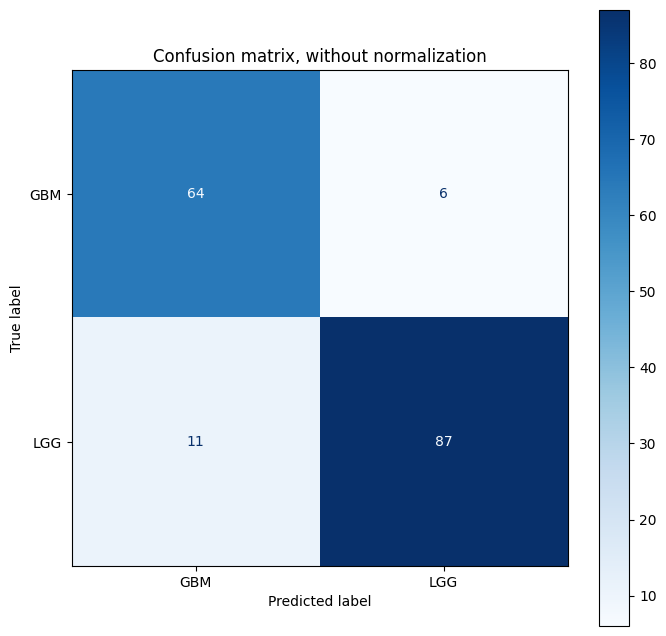

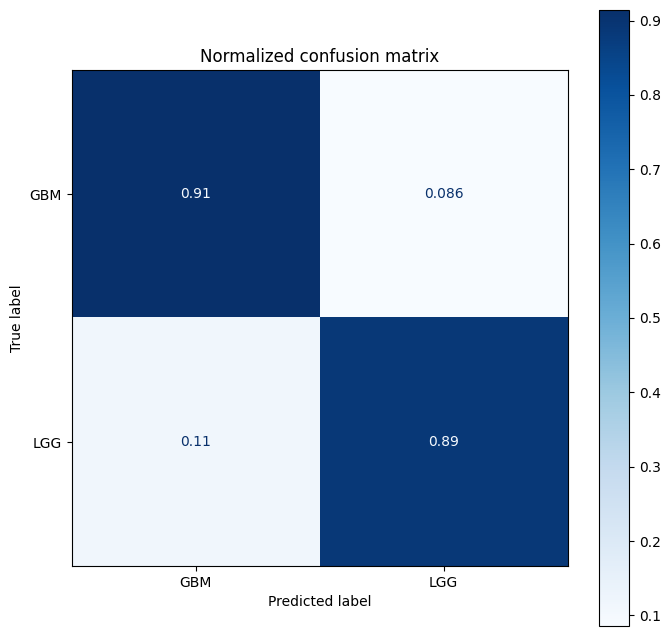

In [ ]:
# save the target variable classes
class_names = le_name_map.keys()

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(8, 8))

    disp = ConfusionMatrixDisplay.from_estimator(
        model_RandomF_optuna,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
        ax = ax
    )
    disp.ax_.set_title(title)
    disp.ax_.grid(False)

    print(title)
    print(disp.confusion_matrix)

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_RandomF_optuna.feature_importances_,X_train.columns)), columns=['Value','Feature'])
feature_imp

,Value,Feature
0,0.000000,Race_american indian or alaska native
1,0.001066,SMARCA4_MUTATED
2,0.001078,CSMD3_NOT_MUTATED
3,0.001098,CSMD3_MUTATED
4,0.001184,SMARCA4_NOT_MUTATED
5,0.001375,BCOR_NOT_MUTATED
6,0.001460,BCOR_MUTATED
7,0.001917,FAT4_NOT_MUTATED
8,0.001947,FAT4_MUTATED
9,0.002205,GRIN2A_NOT_MUTATED


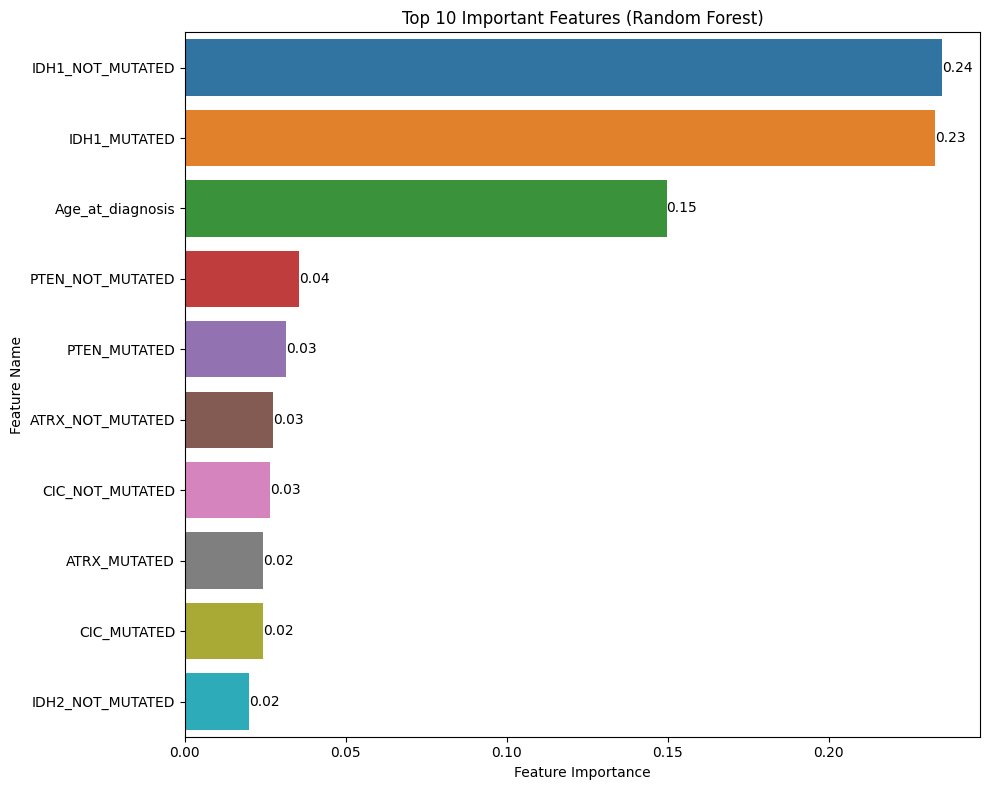

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_RandomF_optuna.feature_importances_, X_train.columns)), columns=['Value', 'Feature'])

# Select the top 10 features with the largest importance values
top_10_features = feature_imp.nlargest(10, 'Value')

plt.figure(figsize=(10, 8))
ax = sns.barplot(x="Value", y="Feature", data=top_10_features)
plt.title('Top 10 Important Features (Random Forest)')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')

# Annotate each bar with its value
for index, value in enumerate(top_10_features['Value']):
    ax.text(value, index, f'{value:.2f}', ha='left', va='center')

plt.tight_layout()
plt.show()


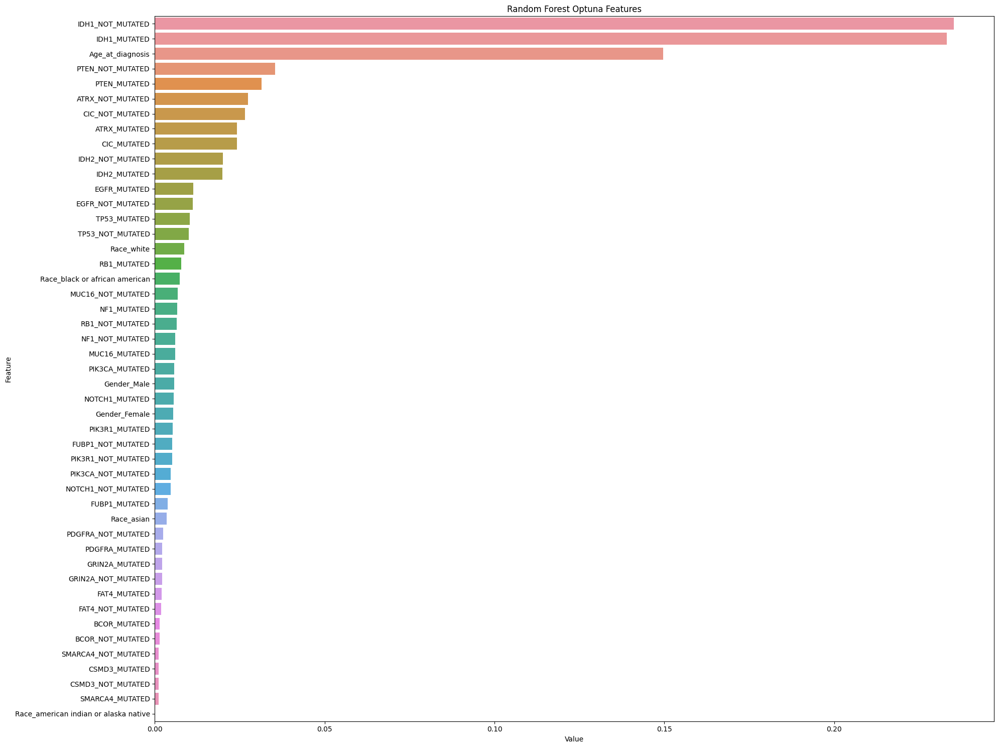

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model_RandomF_optuna.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 15))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('Random Forest Optuna Features')
plt.tight_layout()
# plt.savefig('lightgbm_fimp.png')

# VOTING CLASSIFIER ENSEMBLE

In [ ]:
from sklearn.ensemble import VotingClassifier

In [ ]:
# voting_clf1 = VotingClassifier(estimators=[
#          ('Catboost', model_Cat_optuna), ('XGBoost', model_xgb_optuna), ('LGBM', model_lgb_optuna)
#          , ('ExtraTree', model_ExtraT_optuna), ('RandomForest', model_RandomF_optuna), ('NaiveBayes', model_Gnb_optuna)], voting='hard', verbose=0)
# voting_clf1.fit(X_train, y_train)

In [ ]:
voting_clf2 = VotingClassifier(estimators=[
         ('Ridge Classifier', model_RidgeC_optuna), ('XGBoost', model_xgb_optuna), ('ExtraTree Classifier', model_ExtraT_optuna)
         ], voting='soft', verbose=0) #, ('NaiveBayes', model_Gnb_optuna) , ('RandomForest', model_RandomF_optuna)


In [ ]:
model_RidgeC_optuna

RidgeClassifier(alpha=0.6969932662844646)

In [ ]:
model_xgb_optuna

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.01446338279780691, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.19742061908192798,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.0872093937702263,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=988, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
params_xg = {'max_depth': 1,
 'learning_rate': 0.0872093937702263,
 'n_estimators': 988,
 'min_child_weight': 2,
 'gamma': 0.19742061908192798,
 'subsample': 0.9034895892313103,
 'colsample_bytree': 0.01446338279780691,
 'reg_alpha': 0.08929207215100589,
 'reg_lambda': 8.116062455767412e-07,
 'seed': 1808}
model_xgb_optuna = XGBClassifier(**params_xg)

In [ ]:
params_x = {'max_depth':6, 'n_estimators':500}
model_ExtraT_optuna = ExtraTreesClassifier(**params_x)

In [ ]:
params_r = {'alpha': 0.6969932662844646}
model_RidgeC_optuna = RidgeClassifier(**params_r)

In [ ]:
voting_clf2 = VotingClassifier(estimators=[
         ('Ridge Classifier', model_RidgeC_optuna), ('XGBoost', model_xgb_optuna), ('ExtraTree Classifier', model_ExtraT_optuna)
         ], voting='soft', verbose=0) #, ('NaiveBayes', model_Gnb_optuna) , ('RandomForest', model_RandomF_optuna)


In [ ]:
voting_clf2

VotingClassifier(estimators=[('Ridge Classifier',
                              RidgeClassifier(alpha=0.6969932662844646)),
                             ('XGBoost',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.01446338279780691,
                                            device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None,
                                            gamma=0....
                                            max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=1,
                                            max_leaves=None, min_child_weight=2,
                                            missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=988, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('ExtraTree Classifier',
                              ExtraTreesClassifier(max_depth=6,
                                                   n_estimators=500))],
                 verbose=0, voting='soft')

In [ ]:
estimator = []
estimator.append(('Ridge Classifier', model_RidgeC_optuna))
estimator.append(('XGBoost', model_xgb_optuna))
estimator.append(('ExtraTree Classifier', model_ExtraT_optuna))
VC_hard = VotingClassifier(estimators = estimator, voting ='hard')

In [ ]:
from statistics import stdev
scores = cross_validate(VC_hard, X, train_targets, cv=5, scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ])

print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))

Accuracy
0.8760621613915027 0.01003314418472453
Precision
0.9392947272042967 0.021351669293781374
Recall
0.8420155691142437 0.03281142123551069
F1 score
0.88720899355257 0.011552478956012156
AUC
nan nan


In [ ]:
estimator = []
#estimator.append(('Ridge Classifier', model_RidgeC_optuna))
estimator.append(('XGBoost', model_xgb_optuna))
estimator.append(('ExtraTree Classifier', model_ExtraT_optuna))
VC_soft = VotingClassifier(estimators = estimator, voting ='soft')

In [ ]:
from statistics import stdev
scores = cross_validate(VC_soft, X, train_targets, cv=5, scoring = ['roc_auc','accuracy', 'precision', 'recall', 'f1' ])
print("Accuracy")
print(np.mean(scores['test_accuracy']), np.std(scores['test_accuracy']))
print("Precision")
print(np.mean(scores['test_precision']), np.std(scores['test_precision']))
print("Recall")
print(np.mean(scores['test_recall']), np.std(scores['test_recall']))
print("F1 score")
print(np.mean(scores['test_f1']), np.std(scores['test_f1']))
print("AUC")
print(np.mean(scores['test_roc_auc']), np.std(scores['test_roc_auc']))

Accuracy
0.8736812090105504 0.0113312678276101
Precision
0.9385937396301806 0.014746119082899049
Recall
0.8378918577740375 0.032124673245628996
F1 score
0.8847769030907873 0.012780134800177428
AUC
0.9197995801444476 0.010768283883489275


In [ ]:
from statistics import stdev
score = cross_val_score(VC_soft, X, train_targets, cv=5, scoring='accuracy')
VC_hard_cv_score = score.mean()
VC_hard_cv_stdev = stdev(score)
print('Cross Validation Recall scores are: {}'.format(score))
print('Average Cross Validation Recall score: ', VC_hard_cv_score)
print('Cross Validation Recall standard deviation: ', VC_hard_cv_stdev)

ValueError: ignored

In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
specificity = make_scorer(recall_score, pos_label=0)
scores = cross_val_score(voting_clf2, X,train_targets , scoring = specificity ,n_jobs = -1,cv = 5)
print("Specificity")
print(np.mean(scores), np.std(scores))

In [ ]:
ensemble_accuracy = np.mean(scores['test_accuracy'])
print("Accuracy : %.2f%%" % (ensemble_accuracy * 100.0))

In [ ]:
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.model_selection import StratifiedKFold

n_splits = 5
cv = StratifiedKFold(n_splits=n_splits)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(6, 6))
for fold, (train, test) in enumerate(cv.split(X, train_targets)):
    voting_clf2.fit(X.iloc[train], train_targets.iloc[train])
    viz = RocCurveDisplay.from_estimator(
        voting_clf2,
        X.iloc[test],
        train_targets.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        #plot_chance_level=True,
    )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    #title=f"Mean ROC curve with variability\n(Positive label '{target_names[1]}')",
)
ax.axis("square")
ax.legend(loc="lower right")
plt.show()

In [ ]:
voting_clf2.fit(X_train, y_train)
y_pred = voting_clf2.predict(X_test)

Accuracy after tuning: 89.72%


# STACKING CLASSIFIER ENSEMBLE

In [ ]:
# from mlxtend.classifier import StackingClassifier
# from sklearn.linear_model import LogisticRegression

# # Create a stacking classifier with the best parameters from each model
# print("- Creating stacking ensemble using optimized base models \n")
# stacking_clf = StackingClassifier(classifiers=[xgb_grid.best_estimator_,
#                                               lgbm_grid.best_estimator_,
#                                               rf_grid.best_estimator_,
#                                               gbm_grid.best_estimator_,
#                                               svc_grid.best_estimator_],
#                                   meta_classifier=LogisticRegression(), verbose=0)
# stacking_clf.fit(X_train, y_train);

- Creating stacking ensemble using optimized base models 



# EVALUATION RESULTS

# SHOW FEATURE IMPORTANCES

# [V1] SHOW SHAP VALUES [GRID]

In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 3.8 MB/s eta 0:00:00


In [ ]:
model_xgb_optuna.fit(
    X_train,
    y_train,
    eval_set=[(X_test, y_test)],
    verbose=500,
    early_stopping_rounds=20,
)

[0]	validation_0-logloss:0.67945
[472]	validation_0-logloss:0.34040


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.01446338279780691, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.19742061908192798,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.0872093937702263,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=988, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

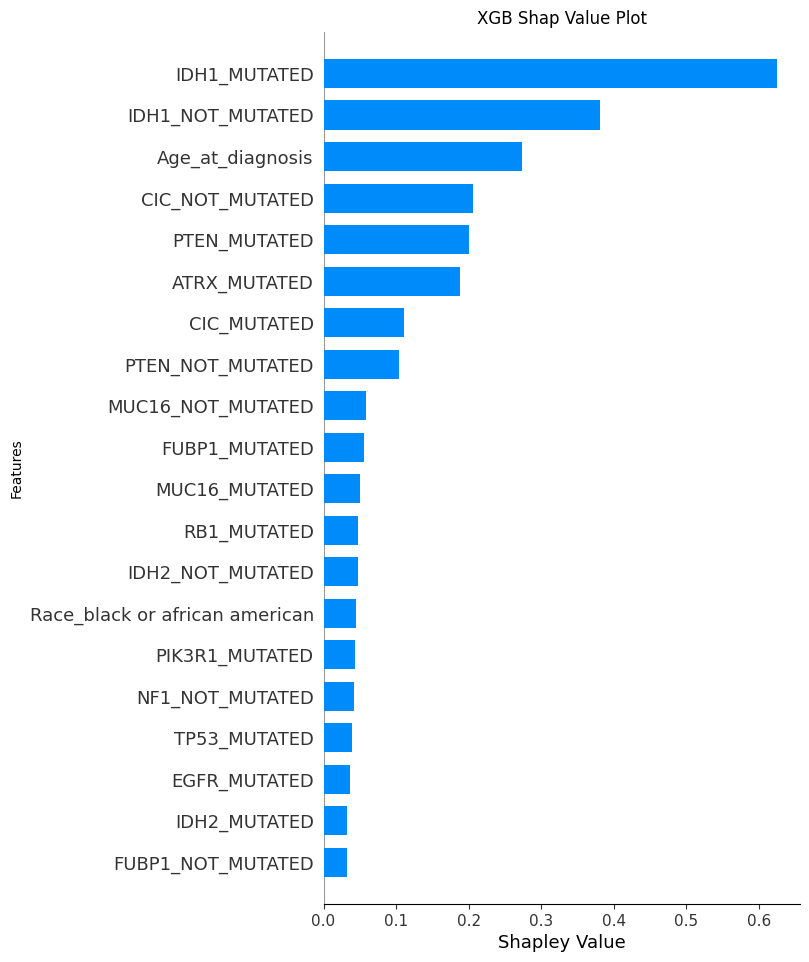

In [ ]:
import shap

# Create an explainer object for each model
xgb_explainer = shap.TreeExplainer(model_xgb_optuna)

# Calculate the Shapley values for each model
xgb_shap_values = xgb_explainer.shap_values(X_train)

# shap_values = shap.TreeExplainer(model_depth1).shap_values(X_test)
# shap_interaction_values = shap.TreeExplainer(model_depth1).shap_interaction_values(
#     X_test
# )

# Plot the Shapley values for each feature
shap.summary_plot(xgb_shap_values, X_train, plot_type='bar', show=False)
plt.title('XGB Shap Value Plot')
plt.xlabel('Shapley Value')
plt.ylabel('Features')
plt.show()

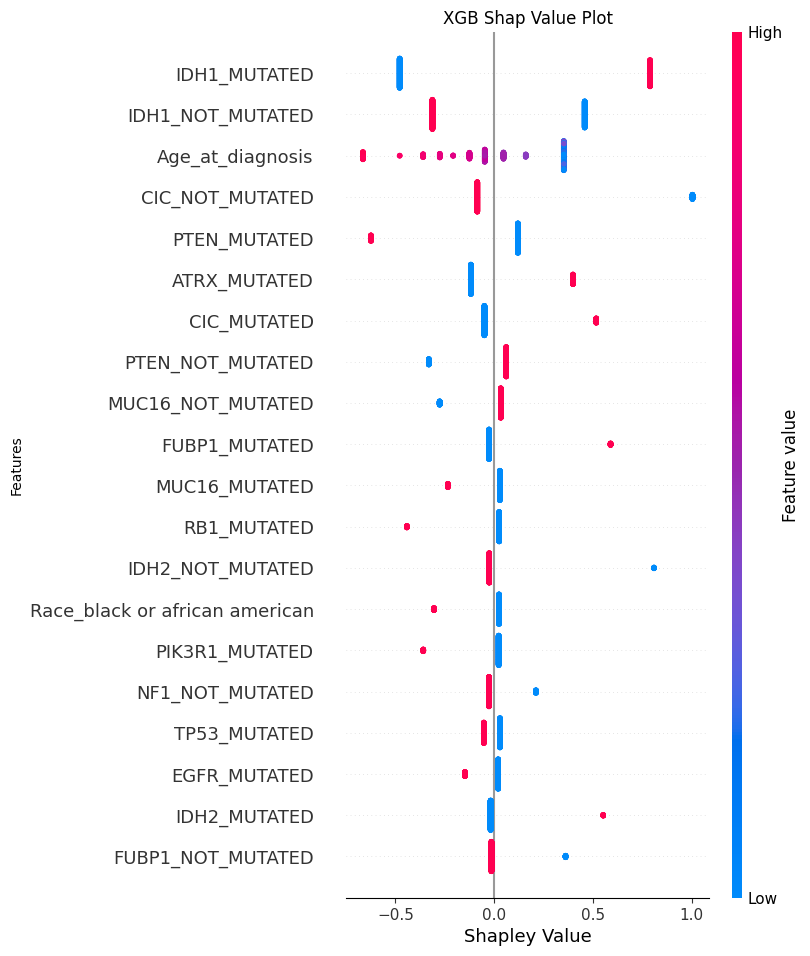

In [ ]:
import shap

# Create an explainer object for each model
xgb_explainer = shap.TreeExplainer(model_xgb_optuna)

# Calculate the Shapley values for each model
xgb_shap_values = xgb_explainer.shap_values(X_train)

# shap_values = shap.TreeExplainer(model_depth1).shap_values(X_test)
# shap_interaction_values = shap.TreeExplainer(model_depth1).shap_interaction_values(
#     X_test
# )

# Plot the Shapley values for each feature
shap.summary_plot(xgb_shap_values, X_train, show=False)
plt.title('XGB Shap Value Plot')
plt.xlabel('Shapley Value')
plt.ylabel('Features')
plt.show()

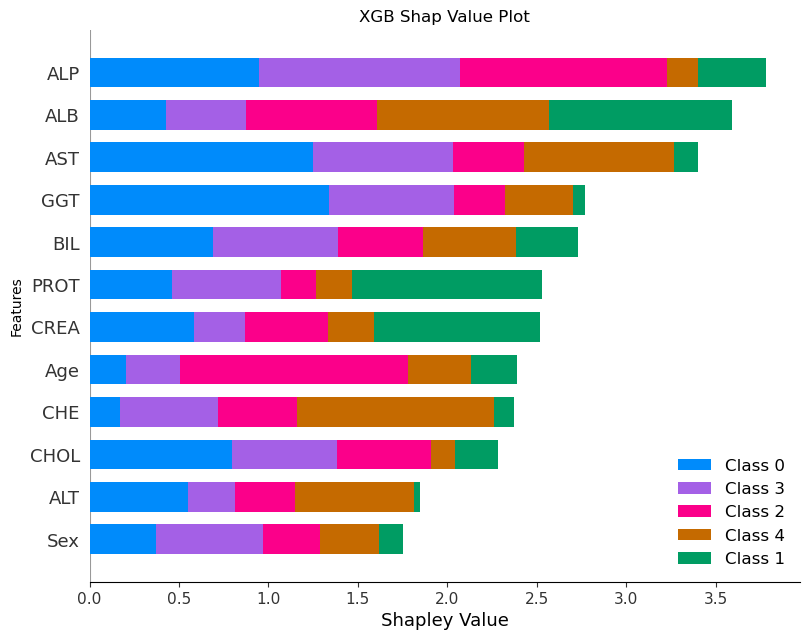

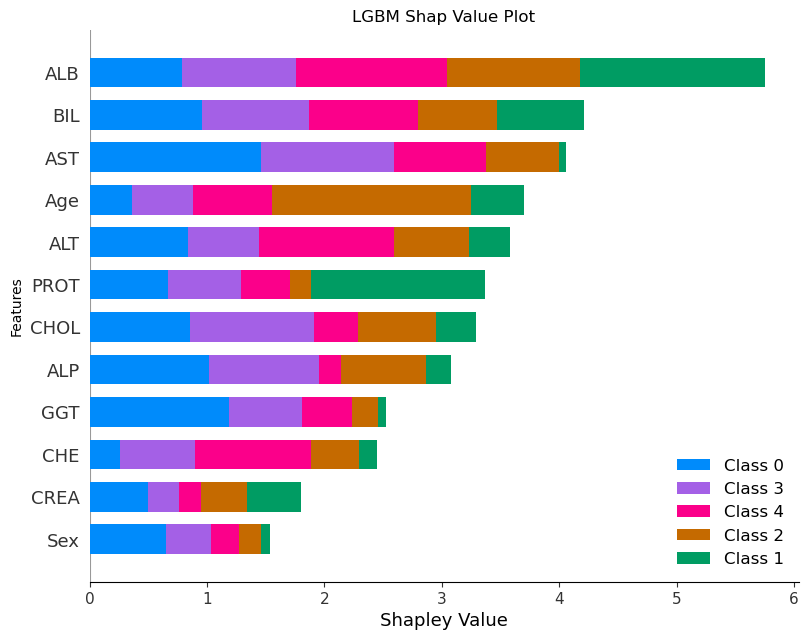

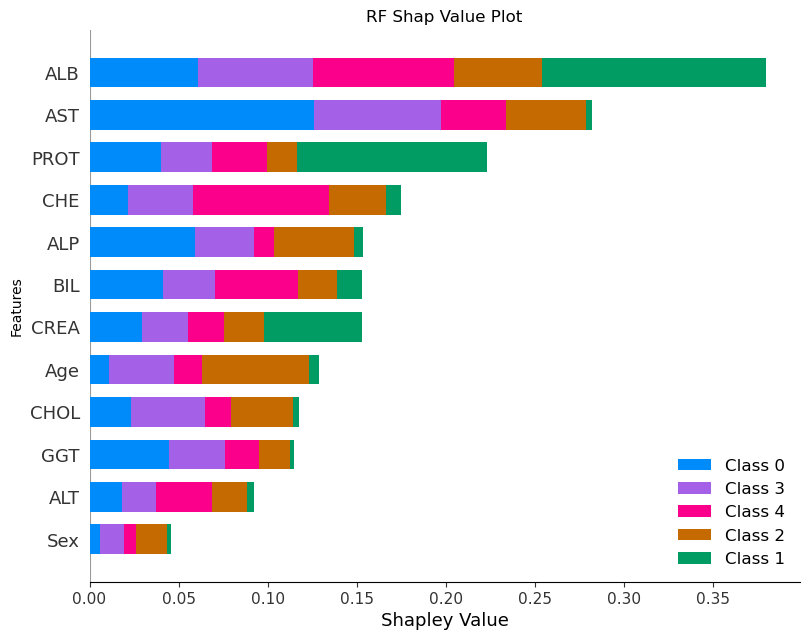


 NOTE: Shap values are only available for GBM for binary classification at this time. 


 NOTE: Shap values are not available for SVC Classifier. The reason for this is that SVC works by finding the optimal hyperplane that separates the data into different classes, based on the support vectors. The position and orientation of the hyperplane are determined by the support vectors themselves, rather than the individual features of the data. Therefore, it is not possible to directly attribute shap values to individual features in SVC. 



In [ ]:
import shap

# Create an explainer object for each model
xgb_explainer = shap.TreeExplainer(xgb_grid.best_estimator_)
lgbm_explainer = shap.TreeExplainer(lgbm_grid.best_estimator_)
rf_explainer = shap.TreeExplainer(rf_grid.best_estimator_)
#gbm_explainer = shap.TreeExplainer(gbm_grid.best_estimator_)                # COMMENT OUT GBM RELATED STUFF (FOR SHAP) IF USING MULTI CLASS

# Calculate the Shapley values for each model
xgb_shap_values = xgb_explainer.shap_values(X_train)
lgbm_shap_values = lgbm_explainer.shap_values(X_train)
rf_shap_values = rf_explainer.shap_values(X_train)
#gbm_shap_values = gbm_explainer.shap_values(X_train)                        # COMMENT OUT GBM RELATED STUFF (FOR SHAP) IF USING MULTI CLASS

# Plot the Shapley values for each feature
shap.summary_plot(xgb_shap_values, X_train, plot_type='bar', show=False)
plt.title('XGB Shap Value Plot')
plt.xlabel('Shapley Value')
plt.ylabel('Features')
plt.show()

shap.summary_plot(lgbm_shap_values, X_train, plot_type='bar', show=False)
plt.title('LGBM Shap Value Plot')
plt.xlabel('Shapley Value')
plt.ylabel('Features')
plt.show()

shap.summary_plot(rf_shap_values, X_train, plot_type='bar', show=False)
plt.title('RF Shap Value Plot')
plt.xlabel('Shapley Value')
plt.ylabel('Features')
plt.show()

#shap.summary_plot(gbm_shap_values, X_train, plot_type='bar', show=False)    # COMMENT OUT GBM RELATED STUFF (FOR SHAP) IF USING MULTI CLASS
#plt.title('GBM Shap Value Plot')
#plt.xlabel('Shapley Value')
#plt.ylabel('Features')
#plt.show()

# Explain that there is no shap values for multi class problems using GBM at this time                       # UNCOMMENT THIS DISCLAIMER (FOR SHAP) about GBM IF USING MULTI CLASS
print("\n NOTE: Shap values are only available for GBM for binary classification at this time. \n")

# Explain that there is no shap values for SVC
print("\n NOTE: Shap values are not available for SVC Classifier. The reason for this is that SVC works by finding the optimal hyperplane that separates the data into different classes, based on the support vectors. The position and orientation of the hyperplane are determined by the support vectors themselves, rather than the individual features of the data. Therefore, it is not possible to directly attribute shap values to individual features in SVC. \n")

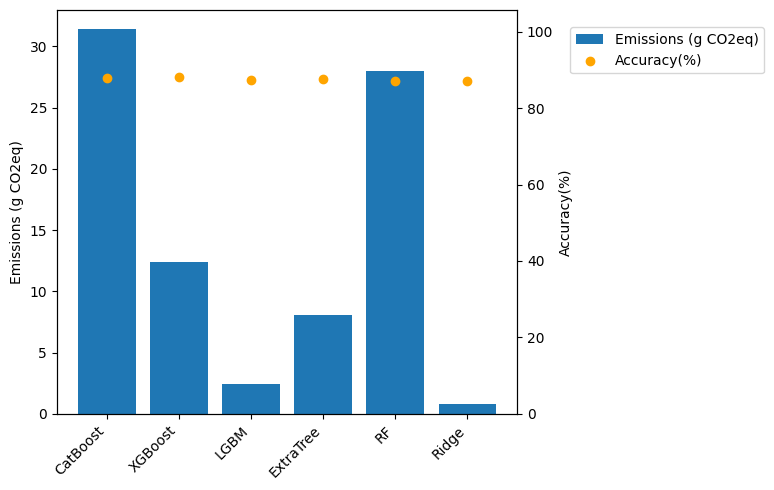

In [ ]:
def plot_comparison(results):
    """
    Plots GHG emissions against Accuracy.
    """
    fig, ax = plt.subplots(figsize=(8, 5))  # Increase the figure width to fit diagonal labels
    ax.bar(results["Category"], results["Emissions"], label="Emissions (g CO2eq)")
    ax.set_ylabel("Emissions (g CO2eq)")

    ax2 = ax.twinx()
    ax2.scatter(
        results["Category"], results["Accuracy"], color="orange", label="Accuracy(%)",
    )
    ax2.set_ylabel("Accuracy(%)")
    ax2.set_ylim([0, max(results["Accuracy"]) * 1.2])

    # ask matplotlib for the plotted objects and their labels
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(
        lines + lines2, labels + labels2, loc="center left", bbox_to_anchor=(1.1, 0.9)
    )

    # Rotate the x-axis tick labels diagonally
    ax.set_xticklabels(results["Category"], rotation=45, ha="right")  # Set ha="right" for better alignment

model_results = pd.DataFrame(
    {
        "Category": ["CatBoost", "XGBoost", "LGBM", "ExtraTree", "RF", "Ridge"],
        "Accuracy": [87.84, 88.08, 87.37, 87.61, 87.01, 87.13],
        "Emissions": [0.03139 * 1000, 0.01236 * 1000, 0.00246 * 1000, 0.00804 * 1000, 0.02799 * 1000, 0.00081 * 1000],
    }
)

plot_comparison(model_results)
plt.tight_layout()  # Adjust the layout to prevent clipping of tick labels
plt.show()


In [ ]:
def plot_comparison(results):
    """
    Plots GHG emissions against Accuracy.
    """
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.bar(results["Category"], results["Emissions"], label="Emissions (g CO2eq)")
    ax.set_ylabel("Emissions (g CO2eq)")

    ax2 = ax.twinx()
    ax2.scatter(
        results["Category"], results["Accuracy"], color="orange", label="Accuracy",
    )
    ax2.set_ylabel("Accuracy")
    ax2.set_ylim([0, max(results["Accuracy"]) * 1.2])

    # ask matplotlib for the plotted objects and their labels
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(
        lines + lines2, labels + labels2, loc="center left", bbox_to_anchor=(1.1, 0.9)
    );




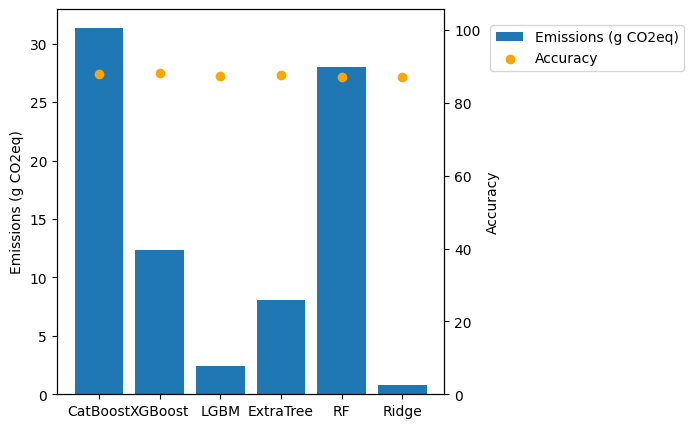

In [ ]:
model_results = pd.DataFrame(
    {
        "Category": ["CatBoost", "XGBoost", "LGBM", "ExtraTree", "RF", "Ridge"],
        "Accuracy": [87.84, 88.08, 87.37, 87.61, 87.01, 87.13],
        "Emissions": [0.03139 * 1000, 0.01236 * 1000, 0.00246 * 1000, 0.00804 * 1000, 0.02799 * 1000, 0.00081 * 1000],
    }
)

plot_comparison(model_results)